# **__Prediction of Covid19 and its Impact of various parameters on Humanity.__**

### PGPDSE-FT ONLINE JULY 21

###### Group No- 4

###### ** Team Members **

1.Narasimha Srivastsava (ZL3F5VHUPG)

2.Raja Gupta (RJ9UET73B0)

3.Kunal Patil (OP41TY3MAL)

4.Sabira Khan (FD36JSGAYK)

5.Sai Sandhya Lakshmi (OH7GIE0NMP)


In [1]:
# Importing the required files

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings(action='ignore')
%matplotlib inline

import statsmodels
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
SS= StandardScaler()
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.anova import anova_lm
from scipy.stats import stats
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor as VIF

In [2]:
# Reading the file
data=pd.read_csv('c.csv')

In [3]:
# Displaying the 5 rows.
data.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2/24/2020,5.0,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2/25/2020,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2/26/2020,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2/27/2020,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2/28/2020,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 152235 entries, 0 to 152234
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    152235 non-null  object 
 1   continent                                   143059 non-null  object 
 2   location                                    152235 non-null  object 
 3   date                                        152235 non-null  object 
 4   total_cases                                 149610 non-null  float64
 5   new_cases                                   149585 non-null  float64
 6   new_cases_smoothed                          148434 non-null  float64
 7   total_deaths                                132419 non-null  float64
 8   new_deaths                                  132604 non-null  float64
 9   new_deaths_smoothed                         132472 non-null  float64
 

In [5]:
data.describe()

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
count,1.496100e+05,1.495850e+05,1.484340e+05,1.324190e+05,132604.000000,132472.00000,148912.000000,148887.000000,147741.000000,131734.000000,...,97193.000000,95793.000000,62842.000000,113367.000000,142093.000000,124956.000000,5.234000e+03,5234.000000,5234.000000,5234.000000
mean,2.119570e+06,8.273267e+03,8.169856e+03,5.251414e+04,170.751848,170.34185,23205.952715,103.346610,101.073786,454.217184,...,10.584714,32.757705,50.817100,3.026800,73.596654,0.725884,3.479999e+04,9.011418,16.175762,857.853331
std,1.256106e+07,4.803610e+04,4.519384e+04,2.762063e+05,832.166012,813.23989,37830.664418,348.808817,233.851277,718.689555,...,10.498885,13.521563,31.813782,2.452949,7.489948,0.149991,9.949991e+04,16.669961,31.091730,1283.239325
min,1.000000e+00,-7.434700e+04,-6.223000e+03,1.000000e+00,-1918.000000,-232.14300,0.001000,-3125.829000,-272.971000,0.000000,...,0.100000,7.700000,1.188000,0.100000,53.280000,0.394000,-3.195940e+04,-28.450000,-95.920000,-1745.051271
25%,1.556000e+03,1.000000e+00,5.714000e+00,6.800000e+01,0.000000,0.14300,507.327750,0.020000,1.435000,15.712500,...,1.900000,21.600000,19.351000,1.300000,69.500000,0.602000,-9.752500e+01,-0.870000,-0.520000,-37.856745
50%,2.040500e+04,6.900000e+01,9.071400e+01,6.710000e+02,2.000000,2.28600,3990.309000,9.934000,15.778000,104.842500,...,6.300000,31.400000,49.839000,2.400000,75.050000,0.743000,2.580050e+03,5.505000,7.205000,401.789828
75%,2.544080e+05,9.140000e+02,9.671430e+02,6.428500e+03,19.000000,20.28600,30353.578500,85.650000,98.388000,617.547000,...,19.300000,41.300000,83.241000,4.000000,78.930000,0.845000,2.147995e+04,13.887500,22.687500,1456.137413
max,2.952182e+08,2.594868e+06,1.772322e+06,5.457474e+06,18062.000000,14704.71400,320629.832000,51427.491000,7406.207000,6081.252000,...,44.000000,78.100000,100.000000,13.800000,86.750000,0.957000,1.043824e+06,115.000000,374.340000,7912.067517


In [6]:
data.dtypes

iso_code                                    object
continent                                   object
location                                    object
date                                        object
total_cases                                float64
                                            ...   
human_development_index                    float64
excess_mortality_cumulative_absolute       float64
excess_mortality_cumulative                float64
excess_mortality                           float64
excess_mortality_cumulative_per_million    float64
Length: 67, dtype: object

#### VISUALISATION PLOTS FOR VARIOUS ATTRIBUTES TO UNDERSTAND THE DATA.

###### IMPACT OF COVID-19 ON HUMAN LIVES W.R.T AGE.

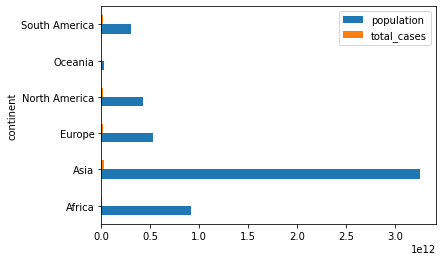

In [7]:
pivot = data.pivot_table(index=['continent'], values=['population','total_cases'], aggfunc='sum').plot(kind='barh')

<AxesSubplot:title={'center':'Total Covid positive cases against the each continents covering the median of all ages'}, xlabel='continent', ylabel='median_age'>

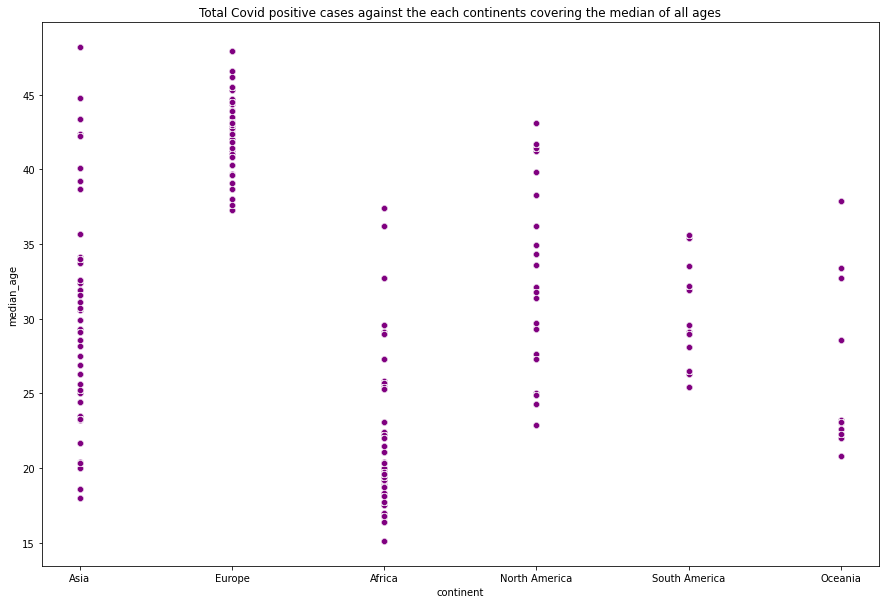

In [8]:
plt.figure(figsize=(15,10))
plt.title('Total Covid positive cases against the each continents covering the median of all ages')
sns.scatterplot(x= 'continent', y= 'median_age', data = data, color='purple', markers=True)

<AxesSubplot:title={'center':'Total Covid-19 positive cases against each continents showing people above 65 years of age'}, xlabel='aged_65_older', ylabel='total_deaths'>

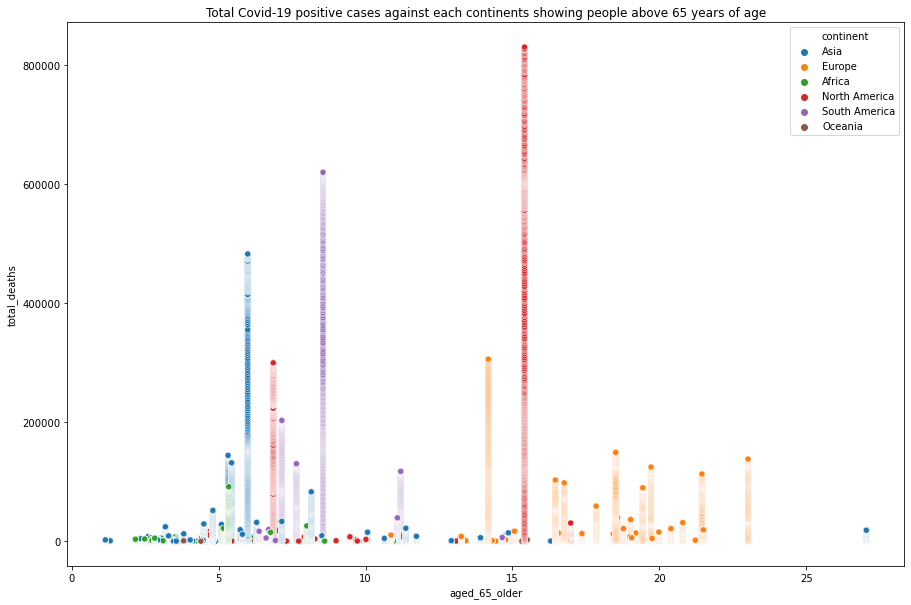

In [9]:
plt.figure(figsize=(15,10))
plt.title('Total Covid-19 positive cases against each continents showing people above 65 years of age')
sns.scatterplot(x= 'aged_65_older', y ='total_deaths',hue= 'continent' ,data = data)

<AxesSubplot:title={'center':'Total Covid-19 positive cases against each continents showing people above 70 years of age'}, xlabel='aged_70_older', ylabel='total_deaths'>

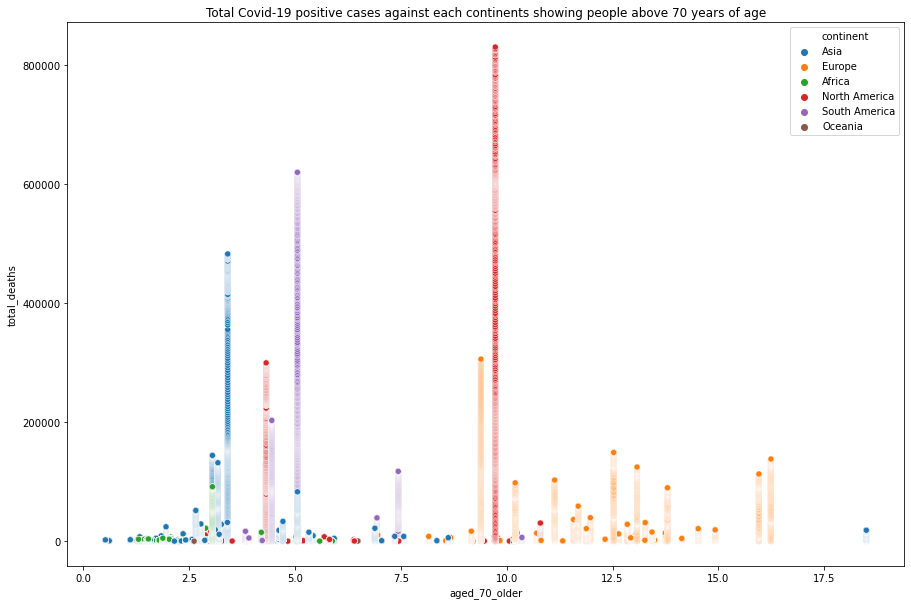

In [10]:
plt.figure(figsize=(15,10))
plt.title('Total Covid-19 positive cases against each continents showing people above 70 years of age')
sns.scatterplot(y= 'total_deaths', x ='aged_70_older',hue= 'continent' ,data = data)

###### ANALYSIS OF TOTAL TESTS, TOTAL CASES W.R.T POPULATION FOR EACH CONTINENT.

<AxesSubplot:xlabel='population', ylabel='total_cases'>

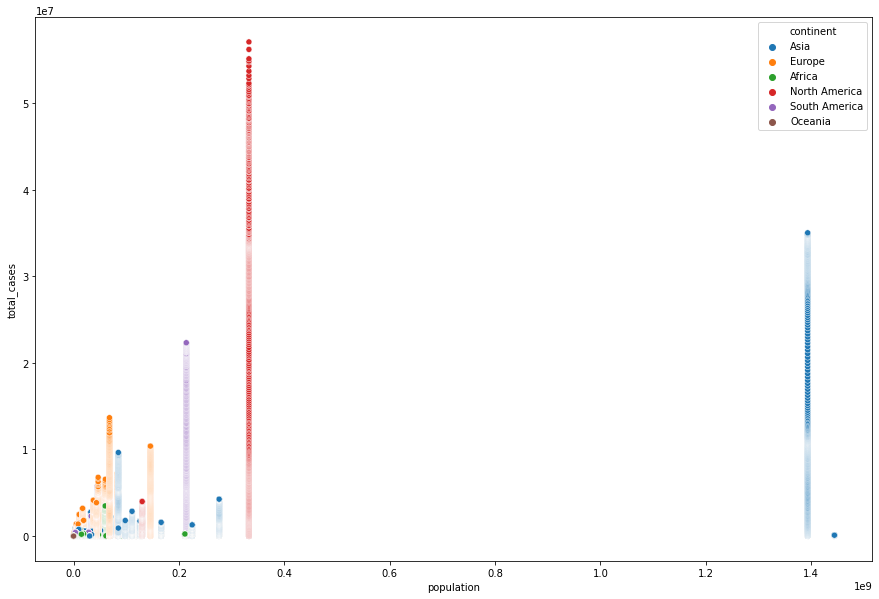

In [11]:
plt.figure(figsize=(15,10))
sns.scatterplot(x='population',y='total_cases',hue='continent',data=data)

In [12]:
pivot1 = data.pivot_table(index=['continent'], values=['total_tests'], aggfunc='sum')

In [13]:
px.bar(x=pivot1.index,y=pivot1.total_tests,title='Total Tests as per each Continent')

<AxesSubplot:xlabel='continent', ylabel='gdp_per_capita'>

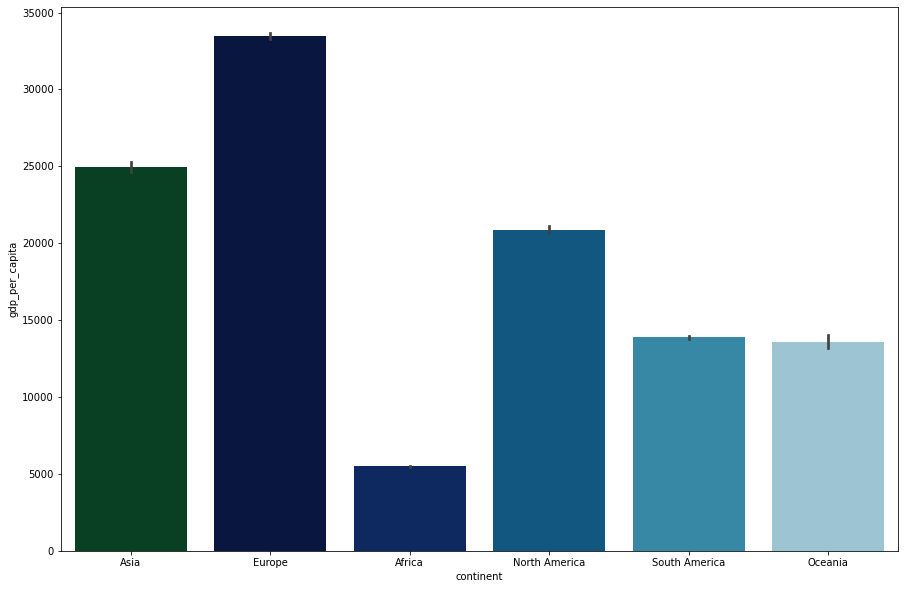

In [14]:
plt.figure(figsize=(15,10))
sns.barplot(x='continent',y='gdp_per_capita',data=data,color='g',palette='ocean')

######  EXCESS MORTALITY DURING COVID 19 PANDEMIC

In [15]:
df_excess_mortality= data[['continent','date','total_deaths','population','excess_mortality']]

<AxesSubplot:xlabel='continent', ylabel='excess_mortality'>

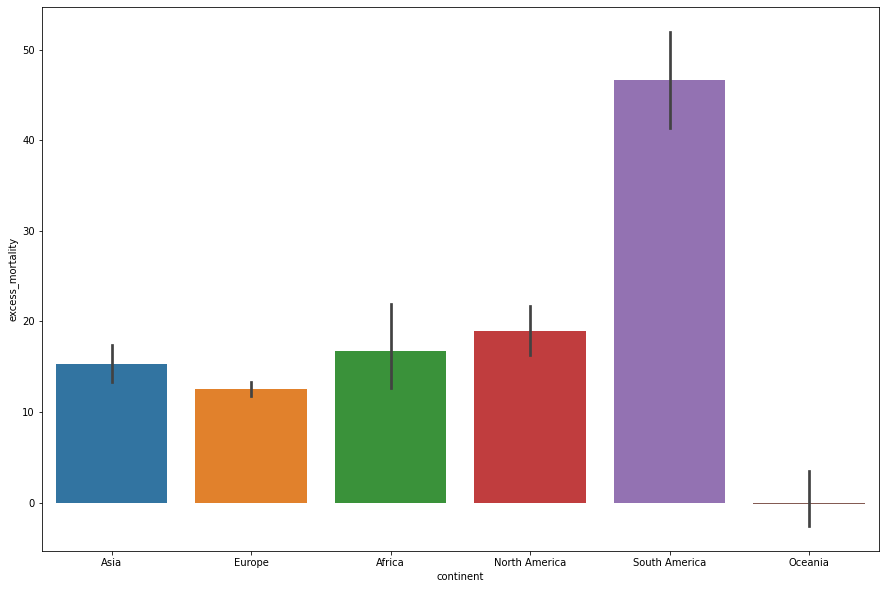

In [16]:
plt.figure(figsize=(15,10))
sns.barplot(data=df_excess_mortality,x='continent',y='excess_mortality')

## Total Cases w.r.t Total Tests.

In [17]:
df_1st= data[['continent','location','date','total_cases','total_tests']]

In [18]:
df_1st.isnull().sum()

continent       9176
location           0
date               0
total_cases     2625
total_tests    90476
dtype: int64

In [19]:
df_1st.head()

,continent,location,date,total_cases,total_tests
0,Asia,Afghanistan,2/24/2020,5.0,NaN
1,Asia,Afghanistan,2/25/2020,5.0,NaN
2,Asia,Afghanistan,2/26/2020,5.0,NaN
3,Asia,Afghanistan,2/27/2020,5.0,NaN
4,Asia,Afghanistan,2/28/2020,5.0,NaN


In [20]:
df_1st.shape

(152235, 5)

**Treating the null values**

In [21]:
# Replacing the null values in categorical variable with the most occuring category.

df_1st['continent'].replace(to_replace=np.NaN,value='Africa',inplace=True)

In [22]:
# Treating the null values, filling the null values with median with respect to each continent.

# Treating the total_tests

df_1st.total_tests = df_1st.groupby('continent')['total_tests'].apply(lambda x: x.fillna(x.median()))
df_1st.total_tests = df_1st.total_tests.fillna(df_1st.total_tests.median())

# Treating the total_cases

df_1st.total_cases = df_1st.groupby('continent')['total_cases'].apply(lambda x: x.fillna(x.median()))
df_1st.total_cases = df_1st.total_cases.fillna(df_1st.total_cases.median())

In [23]:
df_1st.sample(10)


,continent,location,date,total_cases,total_tests
59322,South America,Guyana,10/10/2020,3405.0,1807860.0
12150,Asia,Bangladesh,10/7/2021,1560818.0,9870144.0
112396,Asia,Qatar,6/28/2021,221810.0,2155430.0
122299,Africa,Sierra Leone,8/25/2020,2001.0,494713.5
40654,Africa,Egypt,6/21/2020,55233.0,494713.5
145714,South America,Uruguay,3/23/2021,86007.0,1250503.0
134081,Asia,Taiwan,12/26/2020,783.0,123614.0
101281,Africa,Nigeria,10/15/2020,60982.0,567857.0
112888,Europe,Romania,12/23/2020,604251.0,4656714.0
18151,North America,Bonaire Sint Eustatius and Saba,10/23/2021,2383.0,756998.5


In [24]:
df_1st[df_1st['continent']=='Africa']['location'].unique()

array(['Africa', 'Algeria', 'Angola', 'Asia', 'Benin', 'Botswana',
       'Burkina Faso', 'Burundi', 'Cameroon', 'Cape Verde',
       'Central African Republic', 'Chad', 'Comoros', 'Congo',
       "Cote d'Ivoire", 'Democratic Republic of Congo', 'Djibouti',
       'Egypt', 'Equatorial Guinea', 'Eritrea', 'Eswatini', 'Ethiopia',
       'Europe', 'European Union', 'Gabon', 'Gambia', 'Ghana', 'Guinea',
       'Guinea-Bissau', 'High income', 'International', 'Kenya',
       'Lesotho', 'Liberia', 'Libya', 'Low income', 'Lower middle income',
       'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Mauritius',
       'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Nigeria',
       'North America', 'Oceania', 'Rwanda', 'Saint Helena',
       'Sao Tome and Principe', 'Senegal', 'Seychelles', 'Sierra Leone',
       'Somalia', 'South Africa', 'South America', 'South Sudan', 'Sudan',
       'Tanzania', 'Togo', 'Tunisia', 'Uganda', 'Upper middle income',
       'World', 'Zambia', 'Zimbabwe'], dtype=obj

In [25]:
df_1st.isnull().sum()

continent      0
location       0
date           0
total_cases    0
total_tests    0
dtype: int64

In [26]:
# Separting the year and month from date column.

In [27]:
df_1st['year'] = pd.DatetimeIndex(df_1st['date']).year 
df_1st['month'] = pd.DatetimeIndex(df_1st['date']).month 

In [28]:
df_1st.drop(columns=['date'],inplace=True)

In [29]:
df_1st.sample(10)

,continent,location,total_cases,total_tests,year,month
152102,Africa,Zimbabwe,123711.0,1112938.0,2021,8
106188,Asia,Pakistan,1282510.0,3008374.5,2021,11
128205,Asia,South Korea,274415.0,12793757.0,2021,9
121830,Africa,Seychelles,1987.0,494713.5,2021,2
40380,South America,Ecuador,493767.0,1628513.0,2021,8
62275,Asia,Hong Kong,11786.0,3008374.5,2021,5
61162,North America,Honduras,110.0,756998.5,2020,3
148527,Asia,Vietnam,288.0,3008374.5,2020,5
25884,Africa,Cape Verde,11696.0,494713.5,2020,12
35686,Europe,Cyprus,113055.0,11297171.0,2021,8


In [30]:
df_1st_grouped = df_1st.groupby(['continent','year','month'],as_index=True)[['total_cases','total_tests']].sum()
df_1st_grouped1=pd.DataFrame(df_1st_grouped).sample(10)
df_1st_grouped1

,,,total_cases,total_tests
continent,year,month,,
Africa,2020,5,4.721603e+08,8.163599e+08
Europe,2020,1,6.598250e+05,5.832000e+07
North America,2020,4,2.148192e+07,7.015745e+08
Europe,2021,12,2.508784e+09,4.033962e+10
South America,2021,11,1.160170e+09,3.283111e+09
Oceania,2021,9,5.904658e+06,1.331878e+09
Asia,2021,1,6.825467e+08,1.215310e+10
Oceania,2021,11,1.034725e+07,1.709544e+09
Asia,2021,9,2.202237e+09,3.149067e+10


In [31]:
df_1st.dtypes

continent       object
location        object
total_cases    float64
total_tests    float64
year             int64
month            int64
dtype: object

In [32]:
# Plotting the graphs for analysis

In [33]:
# Plotting of Total_tests

fig=px.treemap(df_1st,path=[px.Constant('total_tests'),'continent','location'],values='total_tests',color='location')
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

<AxesSubplot:xlabel='year', ylabel='total_cases'>

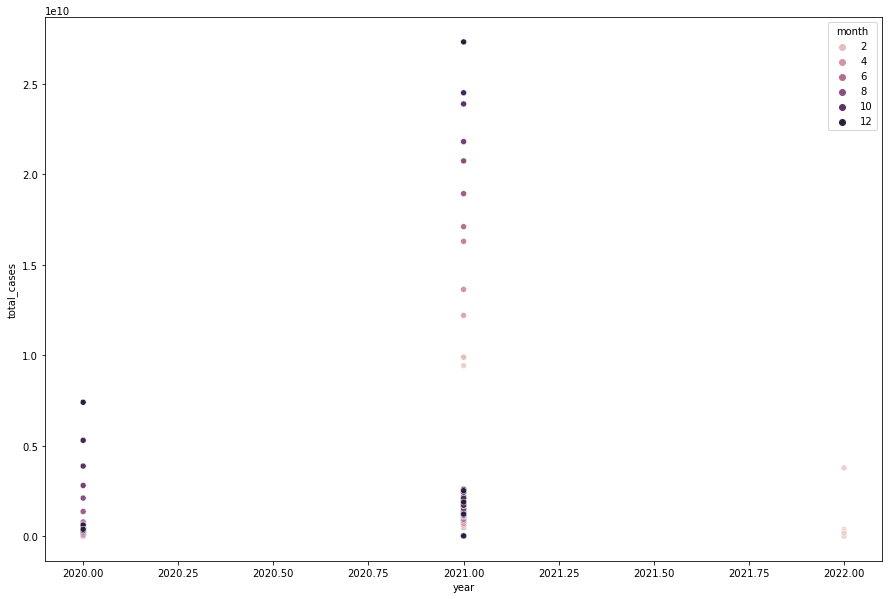

In [34]:
plt.figure(figsize=(15,10))
sns.scatterplot(hue='month',y='total_cases',x='year',data=df_1st_grouped)

<AxesSubplot:xlabel='year', ylabel='total_tests'>

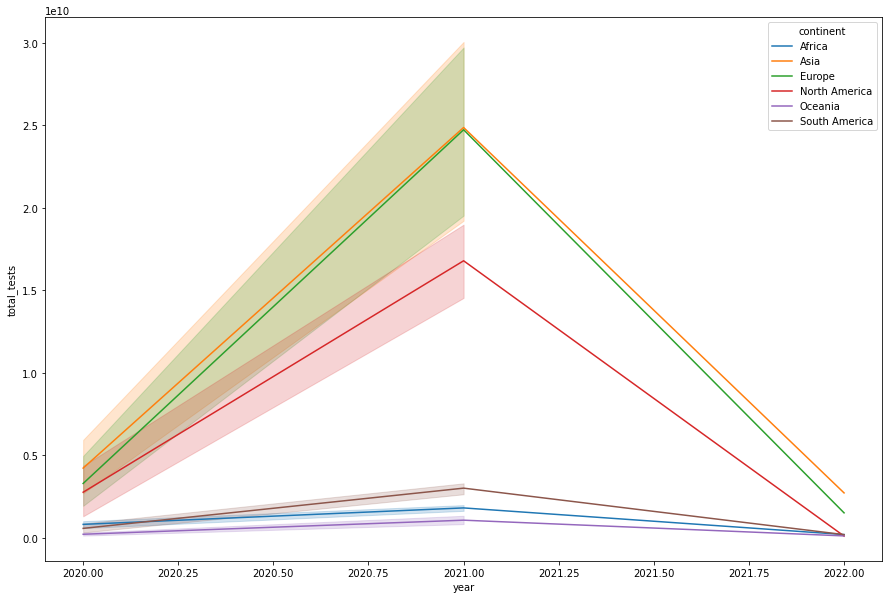

In [35]:
plt.figure(figsize=(15,10))
sns.lineplot(hue='continent',y='total_tests',x='year',data=df_1st_grouped)

# Impact of Vaccination on the Positivity of COVID 19 pandemic

In [256]:
df_2nd= data[['continent','date','total_cases','new_cases','total_deaths','population','total_vaccinations','people_vaccinated','people_fully_vaccinated','positive_rate']]

In [257]:
df_2nd.head()

,continent,date,total_cases,new_cases,total_deaths,population,total_vaccinations,people_vaccinated,people_fully_vaccinated,positive_rate
0,Asia,2/24/2020,5.0,5.0,NaN,39835428.0,NaN,NaN,NaN,NaN
1,Asia,2/25/2020,5.0,0.0,NaN,39835428.0,NaN,NaN,NaN,NaN
2,Asia,2/26/2020,5.0,0.0,NaN,39835428.0,NaN,NaN,NaN,NaN
3,Asia,2/27/2020,5.0,0.0,NaN,39835428.0,NaN,NaN,NaN,NaN
4,Asia,2/28/2020,5.0,0.0,NaN,39835428.0,NaN,NaN,NaN,NaN


In [258]:
df_2nd.shape

(152235, 10)

In [259]:
`# Separting the year and month from date column. 

In [260]:
df_2nd['year'] = pd.DatetimeIndex(df_2nd['date']).year 
df_2nd['month'] = pd.DatetimeIndex(df_2nd['date']).month 

In [261]:
df_2nd.drop(columns=['date'],inplace=True)

In [262]:
df_2nd.head()


,continent,total_cases,new_cases,total_deaths,population,total_vaccinations,people_vaccinated,people_fully_vaccinated,positive_rate,year,month
0,Asia,5.0,5.0,NaN,39835428.0,NaN,NaN,NaN,NaN,2020,2
1,Asia,5.0,0.0,NaN,39835428.0,NaN,NaN,NaN,NaN,2020,2
2,Asia,5.0,0.0,NaN,39835428.0,NaN,NaN,NaN,NaN,2020,2
3,Asia,5.0,0.0,NaN,39835428.0,NaN,NaN,NaN,NaN,2020,2
4,Asia,5.0,0.0,NaN,39835428.0,NaN,NaN,NaN,NaN,2020,2


In [263]:
# Checking the null values

In [264]:
null_perc = df_2nd.isnull().sum()/len(df_2nd)*100
null_values = df_2nd.isnull().sum()

Null_values = pd.concat([null_values,null_perc],axis=1,keys = ['Null values','Null %'])

Null_values

,Null values,Null %
continent,9176,6.027523
total_cases,2625,1.724308
new_cases,2650,1.740730
total_deaths,19816,13.016718
population,1015,0.666732
total_vaccinations,113218,74.370546
people_vaccinated,114845,75.439288
people_fully_vaccinated,117732,77.335698
positive_rate,83431,54.804086
year,0,0.000000


In [244]:
df_2nd_num = df_2nd.select_dtypes(include=np.number)

array([[<AxesSubplot:title={'center':'total_cases'}>,
        <AxesSubplot:title={'center':'new_cases'}>,
        <AxesSubplot:title={'center':'total_deaths'}>],
       [<AxesSubplot:title={'center':'population'}>,
        <AxesSubplot:title={'center':'total_vaccinations'}>,
        <AxesSubplot:title={'center':'people_vaccinated'}>],
       [<AxesSubplot:title={'center':'people_fully_vaccinated'}>,
        <AxesSubplot:title={'center':'positive_rate'}>,
        <AxesSubplot:title={'center':'year'}>],
       [<AxesSubplot:title={'center':'month'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

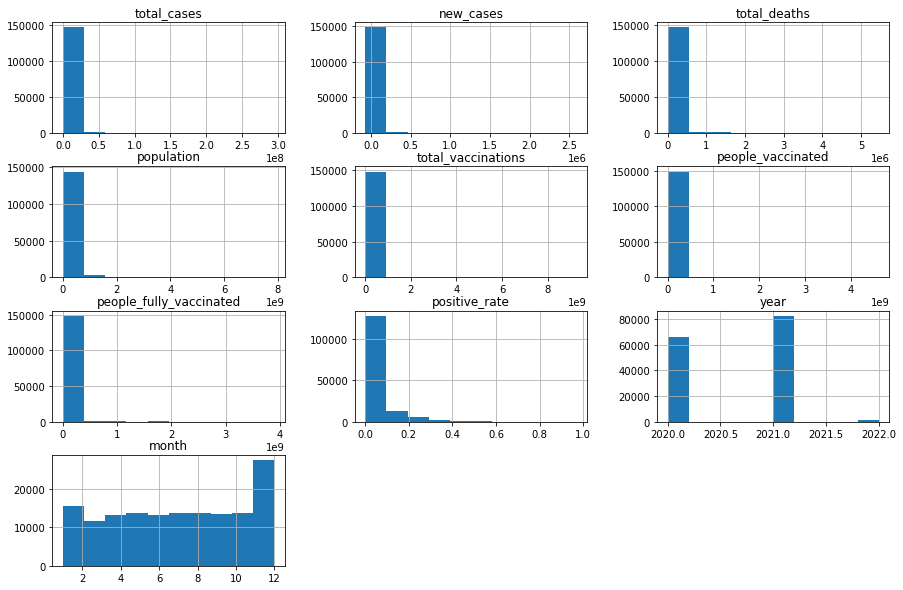

In [249]:
plt.rcParams['figure.figsize'] = [15,10]
df_2nd_num.hist()

In [45]:
df_2nd['continent'].value_counts()

Africa           36117
Europe           34019
Asia             33294
North America    22824
South America     8802
Oceania           8003
Name: continent, dtype: int64

In [265]:
# Dropping the rows froms total_cases & new_cases as they are only around 2%.

df_2nd.dropna(subset=['total_cases','new_cases'],axis=0,inplace=True)

# Replacing the null values in categorical variable with the most occuring category.

df_2nd['continent'].replace(to_replace=np.NaN,value='Africa',inplace=True)

In [266]:
# Replacing the null values in categorical variable with the most occuring category.

df_2nd['continent'].replace(to_replace=np.NaN,value='Africa',inplace=True)

In [267]:
# Substituting the rest null values with zero.

df_2nd.replace(to_replace=np.NaN,value=0,inplace=True)

In [271]:
NUll_values = pd.DataFrame((df_2nd.isnull().sum()/len(df_2nd)*100),columns=['Null %'])
NUll_values

,Null %
continent,0.0
total_cases,0.0
new_cases,0.0
total_deaths,0.0
population,0.0
total_vaccinations,0.0
people_vaccinated,0.0
people_fully_vaccinated,0.0
positive_rate,0.0
year,0.0


In [50]:
# There are no null values after treating the Null values.

In [51]:
# Grouping the data

In [52]:
df_2nd_grouped = df_2nd.groupby(['month','year','continent'])[['total_vaccinations','people_fully_vaccinated']].sum()
df_2nd_grouped.sample(10)

total_vaccinations  people_fully_vaccinated
month year continent                                                 
11    2021 Africa               7.028323e+11             2.991605e+11
2     2020 Africa               0.000000e+00             0.000000e+00
5     2021 Africa               1.492685e+11             3.632753e+10
6     2020 Asia                 0.000000e+00             0.000000e+00
9     2020 North America        0.000000e+00             0.000000e+00
      2021 South America        1.094442e+10             4.206878e+09
4     2020 Asia                 0.000000e+00             0.000000e+00
8     2021 Europe               1.954173e+10             9.281263e+09
7     2021 Oceania              3.586746e+08             1.046016e+08
9     2021 Asia                 1.112605e+11             1.878760e+10

In [53]:
#checking the outliers

In [54]:
df_vacc_2020= df_2nd[df_2nd['year']==2020]['total_vaccinations']

<AxesSubplot:xlabel='total_vaccinations', ylabel='Density'>

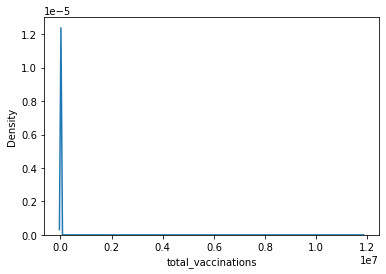

In [55]:
sns.kdeplot(data=df_vacc_2020)

In [56]:
df_vacc_2021= df_2nd[df_2nd['year']==2021]['total_vaccinations']

<AxesSubplot:xlabel='total_vaccinations', ylabel='Density'>

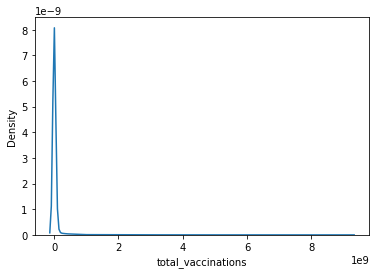

In [57]:
sns.kdeplot(data=df_vacc_2021)

In [250]:
df_vacc_2022= df_2nd[df_2nd['year']==2022]['total_vaccinations']

<AxesSubplot:xlabel='total_vaccinations', ylabel='Density'>

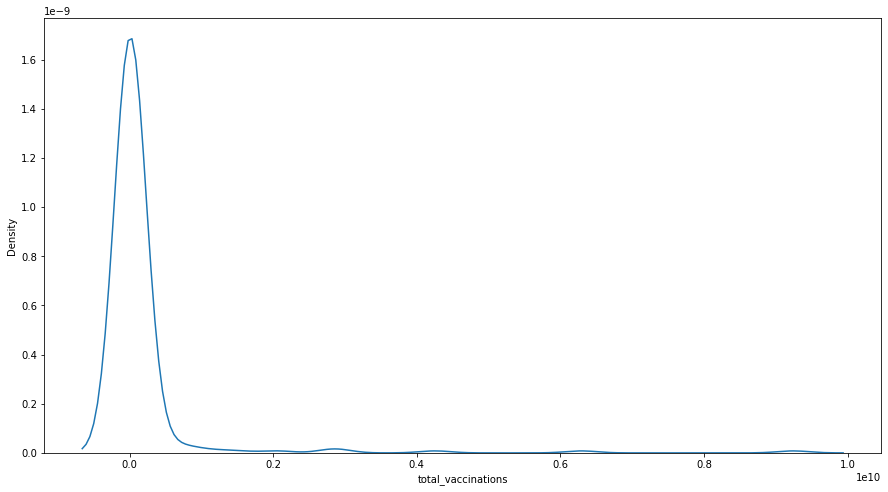

In [252]:
plt.figure(figsize=(15,8))
sns.kdeplot(data=df_vacc_2022)

In [60]:
# Plotting visualisations

In [61]:
pivot2 = data.pivot_table(index=['continent'], values=['total_vaccinations'], aggfunc='sum')

px.bar(x=pivot2.index,y=pivot2.total_vaccinations,title='Total Vaccinations as per each Continent',color=pivot2.total_vaccinations)

In [62]:
df_asia= data[['continent','total_vaccinations','location']]
df_asia= df_asia[df_asia['continent']=='Asia'][['total_vaccinations','location']]

In [63]:
px.bar(x=df_asia.location,y=df_asia.total_vaccinations,title='Total Vaccinations in Asia',color=df_asia.total_vaccinations)

In [64]:
df_northamerica= data[['continent','total_vaccinations','location']]
df_northamerica= df_northamerica[df_northamerica['continent']=='North America'][['total_vaccinations','location']]

In [65]:
px.bar(x=df_northamerica.location,y=df_northamerica.total_vaccinations,title='Total Vaccinations in North America',color=df_northamerica.total_vaccinations)

In [66]:
df_southamerica= data[['continent','total_vaccinations','location']]
df_southamerica= df_southamerica[df_southamerica['continent']=='South America'][['total_vaccinations','location']]

In [67]:
px.bar(x=df_southamerica.location,y=df_southamerica.total_vaccinations,title='Total Vaccinations in South America',color=df_southamerica.total_vaccinations)

In [68]:
df_europe= data[['continent','total_vaccinations','location']]
df_europe= df_europe[df_europe['continent']=='Europe'][['total_vaccinations','location']]

In [69]:
px.bar(x=df_europe.location,y=df_europe.total_vaccinations,title='Total Vaccinations in Europe',color=df_europe.total_vaccinations)

In [70]:
df_africa= data[['continent','total_vaccinations','location']]
df_africa= df_africa[df_africa['continent']=='Africa'][['total_vaccinations','location']]

In [71]:
px.bar(x=df_africa.location,y=df_africa.total_vaccinations,title='Total Vaccinations in Africa',color=df_africa.total_vaccinations)

### model building using SLR


In [72]:
df_num = df_2nd.select_dtypes(include = [np.number])

df_num.columns
df_cat = df_2nd.select_dtypes(include = [np.object])

df_cat.columns
dummy_data = pd.get_dummies(data=df_cat, drop_first=True)
data_final_dummy = pd.concat([df_num,dummy_data], axis=1)

data_final_dummy.tail()
from sklearn.preprocessing import StandardScaler
final_num_col = data_final_dummy.select_dtypes(np.number).columns

SS = StandardScaler()
data_final_dummy = pd.DataFrame(SS.fit_transform(data_final_dummy[final_num_col]), columns = final_num_col)
data_final_dummy.shape
data_features = data_final_dummy.drop(['positive_rate','total_vaccinations','people_vaccinated'], axis=1)

data_target = data_final_dummy['positive_rate']
df_numeric_features_vif = data_final_dummy.select_dtypes(include=[np.number])

# display the first five observations
df_numeric_features_vif.head()
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()

vif["VIF_Factor"] = [variance_inflation_factor(df_numeric_features_vif.values, i) for i in range(df_numeric_features_vif.shape[1])]


vif["Features"] = df_numeric_features_vif.columns


vif.sort_values('VIF_Factor', ascending = False).reset_index(drop = True)

,VIF_Factor,Features
0,52.279323,total_cases
1,37.457197,total_deaths
2,34.270603,people_vaccinated
3,20.339539,people_fully_vaccinated
4,17.285241,total_vaccinations
5,3.952118,new_cases
6,2.198845,population
7,1.431507,continent_Europe
8,1.406501,continent_Asia
9,1.319854,continent_North America


In [73]:
df_numeric_features_vif.skew()

total_cases                11.922773
new_cases                  13.691006
total_deaths               11.465210
population                  8.022555
total_vaccinations         15.666941
people_vaccinated          16.297725
people_fully_vaccinated    18.111717
positive_rate               2.772762
year                       -0.115814
month                      -0.108480
continent_Asia              1.359040
continent_Europe            1.334904
continent_North America     1.955553
continent_Oceania           4.224090
continent_South America     3.783147
dtype: float64

In [74]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')
_vi = pt.fit_transform(df_numeric_features_vif)
data_vi=pd.DataFrame(_vi,columns=df_numeric_features_vif.columns)
data_vi.skew()

total_cases                 1.975282
new_cases                 -23.385715
total_deaths                1.984627
population                  1.668767
total_vaccinations          2.832101
people_vaccinated           2.799672
people_fully_vaccinated     2.860524
positive_rate               0.833485
year                       -0.009239
month                      -0.024396
continent_Asia              1.359040
continent_Europe            1.334904
continent_North America     1.955553
continent_Oceania           4.224090
continent_South America     3.783147
dtype: float64

array([[<AxesSubplot:title={'center':'total_deaths'}>,
        <AxesSubplot:title={'center':'population'}>,
        <AxesSubplot:title={'center':'people_fully_vaccinated'}>],
       [<AxesSubplot:title={'center':'year'}>,
        <AxesSubplot:title={'center':'month'}>,
        <AxesSubplot:title={'center':'continent_Asia'}>],
       [<AxesSubplot:title={'center':'continent_Europe'}>,
        <AxesSubplot:title={'center':'continent_North America'}>,
        <AxesSubplot:title={'center':'continent_Oceania'}>],
       [<AxesSubplot:title={'center':'continent_South America'}>,
        <AxesSubplot:title={'center':'positive_rate_category'}>,
        <AxesSubplot:>]], dtype=object)

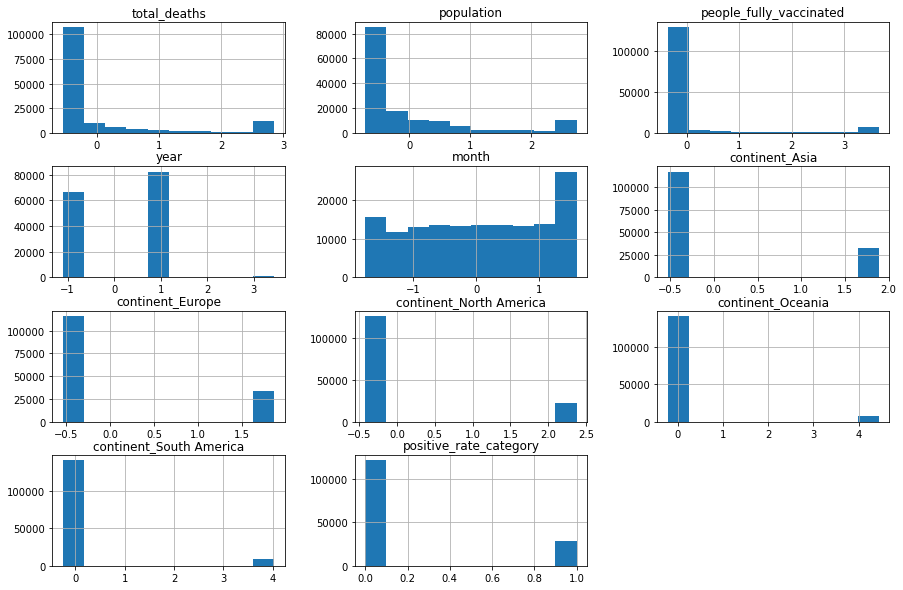

In [253]:
data_vi.hist()

In [75]:
data_vi=data_vi.drop(["new_cases","people_vaccinated"],axis=1)

In [76]:
data_vi=data_vi.drop(['total_cases'],axis=1)

In [77]:
data_vi=data_vi.drop(['total_vaccinations'],axis=1)

In [78]:
vif = pd.DataFrame()

vif["VIF_Factor"] = [variance_inflation_factor(data_vi.values, i) for i in range(data_vi.shape[1])]


vif["Features"] = data_vi.columns


vif.sort_values('VIF_Factor', ascending = False).reset_index(drop = True)

,VIF_Factor,Features
0,3.225124,total_deaths
1,2.605306,population
2,1.885811,people_fully_vaccinated
3,1.717883,continent_Europe
4,1.409654,continent_North America
5,1.392272,continent_Asia
6,1.306737,year
7,1.261376,continent_South America
8,1.164366,continent_Oceania
9,1.155564,positive_rate


In [79]:

X= data_vi.drop('positive_rate',axis=1)
y= data_vi['positive_rate']

X = sm.add_constant(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1, test_size = 0.3)

print('X_train', X_train.shape)
print('y_train', y_train.shape)

print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (104704, 11)
y_train (104704,)
X_test (44874, 11)
y_test (44874,)


In [80]:
model= sm.OLS(y_train,X_train).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:          positive_rate   R-squared:                       0.134
Model:                            OLS   Adj. R-squared:                  0.134
Method:                 Least Squares   F-statistic:                     1618.
Date:                Sun, 03 Apr 2022   Prob (F-statistic):               0.00
Time:                        19:09:19   Log-Likelihood:            -1.4112e+05
No. Observations:              104704   AIC:                         2.823e+05
Df Residuals:                  104693   BIC:                         2.824e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

### Model building using slc: 

In [81]:

data_vi['positive_rate'].describe()

count    1.495780e+05
mean     4.639947e-14
std      1.000003e+00
min     -7.505026e-01
25%     -7.505026e-01
50%     -7.505026e-01
75%      9.812419e-01
max      1.970547e+00
Name: positive_rate, dtype: float64

In [82]:
data_vi.groupby(by=['positive_rate']).count().reset_index()

,positive_rate,total_deaths,population,people_fully_vaccinated,year,month,continent_Asia,continent_Europe,continent_North America,continent_Oceania,continent_South America
0,-0.750503,81529,81529,81529,81529,81529,81529,81529,81529,81529,81529
1,-0.743843,120,120,120,120,120,120,120,120,120,120
2,-0.737198,284,284,284,284,284,284,284,284,284,284
3,-0.730569,373,373,373,373,373,373,373,373,373,373
4,-0.723954,276,276,276,276,276,276,276,276,276,276
...,...,...,...,...,...,...,...,...,...,...,...
4218,1.969389,1,1,1,1,1,1,1,1,1,1
4219,1.969496,1,1,1,1,1,1,1,1,1,1
4220,1.969886,1,1,1,1,1,1,1,1,1,1
4221,1.970432,1,1,1,1,1,1,1,1,1,1


In [83]:
data_vi['positive_rate']=round(data_vi['positive_rate'],2)

In [84]:
data_vi['positive_rate']

0        -0.75
1        -0.75
2        -0.75
3        -0.75
4        -0.75
          ... 
149573    1.88
149574    1.88
149575   -0.75
149576   -0.75
149577   -0.75
Name: positive_rate, Length: 149578, dtype: float64

In [85]:
data_vi.dtypes

total_deaths               float64
population                 float64
people_fully_vaccinated    float64
positive_rate              float64
year                       float64
month                      float64
continent_Asia             float64
continent_Europe           float64
continent_North America    float64
continent_Oceania          float64
continent_South America    float64
dtype: object

In [86]:
data_vi.head()

,total_deaths,population,people_fully_vaccinated,positive_rate,year,month,continent_Asia,continent_Europe,continent_North America,continent_Oceania,continent_South America
0,-0.546142,0.383812,-0.364478,-0.75,-1.098201,-1.472893,1.888536,-0.534837,-0.420814,-0.224778,-0.248067
1,-0.546142,0.383812,-0.364478,-0.75,-1.098201,-1.472893,1.888536,-0.534837,-0.420814,-0.224778,-0.248067
2,-0.546142,0.383812,-0.364478,-0.75,-1.098201,-1.472893,1.888536,-0.534837,-0.420814,-0.224778,-0.248067
3,-0.546142,0.383812,-0.364478,-0.75,-1.098201,-1.472893,1.888536,-0.534837,-0.420814,-0.224778,-0.248067
4,-0.546142,0.383812,-0.364478,-0.75,-1.098201,-1.472893,1.888536,-0.534837,-0.420814,-0.224778,-0.248067


In [87]:
data_vi['positive_rate_category']=pd.cut(data_vi["positive_rate"],bins=[-0.76,1.35,1.97])

In [88]:
data_vi.sort_values('positive_rate_category')

,total_deaths,population,people_fully_vaccinated,positive_rate,year,month,continent_Asia,continent_Europe,continent_North America,continent_Oceania,continent_South America,positive_rate_category
0,-0.546142,0.383812,-0.364478,-0.75,-1.098201,-1.472893,1.888536,-0.534837,-0.420814,-0.224778,-0.248067,"(-0.76, 1.35]"
93379,-0.519555,0.325790,-0.364478,0.20,-1.098201,-0.019423,-0.529511,-0.534837,-0.420814,-0.224778,-0.248067,"(-0.76, 1.35]"
93378,-0.519886,0.325790,-0.364478,0.20,-1.098201,-0.019423,-0.529511,-0.534837,-0.420814,-0.224778,-0.248067,"(-0.76, 1.35]"
93377,-0.520107,0.325790,-0.364478,0.23,-1.098201,-0.019423,-0.529511,-0.534837,-0.420814,-0.224778,-0.248067,"(-0.76, 1.35]"
93376,-0.520438,0.325790,-0.364478,0.18,-1.098201,-0.019423,-0.529511,-0.534837,-0.420814,-0.224778,-0.248067,"(-0.76, 1.35]"
...,...,...,...,...,...,...,...,...,...,...,...,...
17466,1.055701,-0.352229,1.584277,1.75,0.846398,1.586863,-0.529511,-0.534837,-0.420814,-0.224778,4.031175,"(1.35, 1.97]"
17467,1.056184,-0.352229,1.590787,1.68,0.846398,1.586863,-0.529511,-0.534837,-0.420814,-0.224778,4.031175,"(1.35, 1.97]"
17468,1.056727,-0.352229,1.597993,1.66,0.846398,1.586863,-0.529511,-0.534837,-0.420814,-0.224778,4.031175,"(1.35, 1.97]"
17456,1.048079,-0.352229,1.543794,1.65,0.846398,1.255708,-0.529511,-0.534837,-0.420814,-0.224778,4.031175,"(1.35, 1.97]"


In [89]:
data_vi['positive_rate_category'].value_counts().sort_index()

(-0.76, 1.35]    121346
(1.35, 1.97]      28232
Name: positive_rate_category, dtype: int64

In [90]:
bins=[-0.76,1.35,1.97]
labels=['Low','High']
data_vi['positive_rate_category']=pd.cut(data_vi["positive_rate"],bins,labels=labels)

In [91]:
data_vi.sample(10)

,total_deaths,population,people_fully_vaccinated,positive_rate,year,month,continent_Asia,continent_Europe,continent_North America,continent_Oceania,continent_South America,positive_rate_category
108485,0.163575,1.570581,-0.364478,1.24,-1.098201,0.928773,1.888536,-0.534837,-0.420814,-0.224778,-0.248067,Low
137246,-0.279558,1.229492,-0.364478,1.57,-1.098201,-0.905817,1.888536,-0.534837,-0.420814,-0.224778,-0.248067,High
60214,2.854536,2.744852,-0.358015,-0.75,-1.098201,1.586863,-0.529511,-0.534837,-0.420814,-0.224778,-0.248067,Low
42645,-0.546142,-0.606840,-0.364478,-0.75,-1.098201,1.255708,-0.529511,-0.534837,-0.420814,-0.224778,-0.248067,Low
112779,-0.505455,-0.309495,-0.364478,0.44,0.846398,-0.321094,-0.529511,-0.534837,-0.420814,-0.224778,-0.248067,Low
39895,0.051224,-0.176662,-0.364478,-0.75,-1.098201,0.290202,-0.529511,-0.534837,-0.420814,-0.224778,4.031175,Low
82208,-0.457193,-0.703318,-0.364478,-0.20,0.846398,-0.616091,-0.529511,1.869728,-0.420814,-0.224778,-0.248067,Low
74819,-0.383158,-0.511013,-0.364478,-0.75,0.846398,-0.905817,1.888536,-0.534837,-0.420814,-0.224778,-0.248067,Low
139629,2.271291,0.466020,-0.272471,1.52,0.846398,-0.321094,-0.529511,1.869728,-0.420814,-0.224778,-0.248067,High
8854,-0.487690,-0.436416,-0.364478,-0.75,-1.098201,-0.905817,-0.529511,1.869728,-0.420814,-0.224778,-0.248067,Low


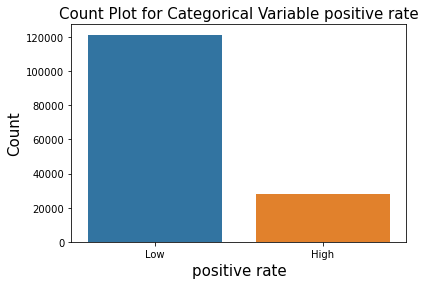

In [92]:
sns.countplot(data_vi["positive_rate_category"])

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Count Plot for Categorical Variable positive rate', fontsize = 15)
plt.xlabel('positive rate', fontsize = 15)
plt.ylabel('Count', fontsize = 15)

# display the plot
plt.show()

In [93]:
data_vi['positive_rate_category']=data_vi['positive_rate_category'].map({'High':1,'Low':0})

In [94]:
data_vi.head()

,total_deaths,population,people_fully_vaccinated,positive_rate,year,month,continent_Asia,continent_Europe,continent_North America,continent_Oceania,continent_South America,positive_rate_category
0,-0.546142,0.383812,-0.364478,-0.75,-1.098201,-1.472893,1.888536,-0.534837,-0.420814,-0.224778,-0.248067,0
1,-0.546142,0.383812,-0.364478,-0.75,-1.098201,-1.472893,1.888536,-0.534837,-0.420814,-0.224778,-0.248067,0
2,-0.546142,0.383812,-0.364478,-0.75,-1.098201,-1.472893,1.888536,-0.534837,-0.420814,-0.224778,-0.248067,0
3,-0.546142,0.383812,-0.364478,-0.75,-1.098201,-1.472893,1.888536,-0.534837,-0.420814,-0.224778,-0.248067,0
4,-0.546142,0.383812,-0.364478,-0.75,-1.098201,-1.472893,1.888536,-0.534837,-0.420814,-0.224778,-0.248067,0


In [95]:
df_target=data_vi["positive_rate_category"]
df_target.value_counts()

0    121346
1     28232
Name: positive_rate_category, dtype: int64

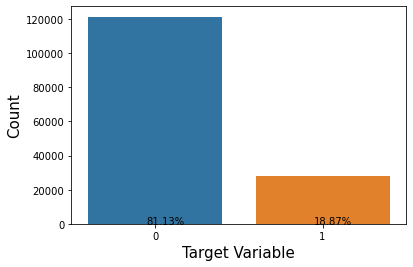

In [96]:
df_target=data_vi["positive_rate_category"]
df_target.value_counts()

sns.countplot(x = df_target)
plt.text(x = -0.05, y = 39, s = str(round((df_target.value_counts()[0])*100/len(df_target),2)) + '%')
plt.text(x = 0.95, y = 24, s = str(round((df_target.value_counts()[1])*100/len(df_target),2)) + '%')
plt.xlabel('Target Variable', fontsize = 15)
plt.ylabel('Count', fontsize = 15)
plt.show()

In [97]:
Total = data_vi.isnull().sum().sort_values(ascending=False)          

Percent = (data_vi.isnull().sum()*100/data_vi.isnull().count()).sort_values(ascending=False)   

missing_data = pd.concat([Total, Percent], axis = 1, keys = ['Total', 'Percentage of Missing Values'])    
missing_data

,Total,Percentage of Missing Values
total_deaths,0,0.0
population,0,0.0
people_fully_vaccinated,0,0.0
positive_rate,0,0.0
year,0,0.0
month,0,0.0
continent_Asia,0,0.0
continent_Europe,0,0.0
continent_North America,0,0.0
continent_Oceania,0,0.0


In [98]:
data_vi['positive_rate_category']=data_vi['positive_rate_category'].astype('int')

In [99]:
data_vi.dtypes

total_deaths               float64
population                 float64
people_fully_vaccinated    float64
positive_rate              float64
year                       float64
month                      float64
continent_Asia             float64
continent_Europe           float64
continent_North America    float64
continent_Oceania          float64
continent_South America    float64
positive_rate_category       int32
dtype: object

In [100]:
data_vi.drop('positive_rate',axis=1,inplace=True)

In [101]:
X= data_vi.drop('positive_rate_category',axis=1)
y= data_vi['positive_rate_category']

X = sm.add_constant(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10, test_size = 0.3)

print('X_train', X_train.shape)
print('y_train', y_train.shape)

print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (104704, 11)
y_train (104704,)
X_test (44874, 11)
y_test (44874,)


In [102]:
y_train

7473      0
133648    0
52153     0
89238     1
105579    1
         ..
9372      0
105595    1
93553     1
94735     0
83209     1
Name: positive_rate_category, Length: 104704, dtype: int32

In [103]:
logreg = sm.Logit(y_train, X_train).fit()

print(logreg.summary())

Optimization terminated successfully.
         Current function value: 0.448777
         Iterations 8
                             Logit Regression Results                             
Dep. Variable:     positive_rate_category   No. Observations:               104704
Model:                              Logit   Df Residuals:                   104693
Method:                               MLE   Df Model:                           10
Date:                    Sun, 03 Apr 2022   Pseudo R-squ.:                 0.07217
Time:                            19:09:25   Log-Likelihood:                -46989.
converged:                           True   LL-Null:                       -50643.
Covariance Type:                nonrobust   LLR p-value:                     0.000
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -1.6404      0.010   -1

After performing logistic regression,we got psuedo R2 value of 0.07217 and there are no insignificant variables present
in the data

In [104]:
df_odds = pd.DataFrame(np.exp(logreg.params), columns= ['Odds']) 

df_odds

,Odds
const,0.193897
total_deaths,1.657430
population,0.929677
people_fully_vaccinated,0.719475
year,1.112720
month,1.097682
continent_Asia,1.354296
continent_Europe,1.468350
continent_North America,1.255171
continent_Oceania,0.625335


In [105]:
df_c = pd.DataFrame(model.params, columns = ['coeffs']).reset_index()

for i in range(0, len(df_c)):
    if df_c['coeffs'][i] > 0 :
        print('1 unit up', df_c['index'][i] ,'feature brings e^',round(df_c['coeffs'][i],2),'units increase in odds of having covid positive.')
    else:
        print('1 unit up', df_c['index'][i] ,'feature brings e^',round(df_c['coeffs'][i],2),'units decrease in odds of having covid positive.')


1 unit up const feature brings e^ 0.0 units increase in odds of having covid positive.
1 unit up total_deaths feature brings e^ 0.25 units increase in odds of having covid positive.
1 unit up population feature brings e^ -0.02 units decrease in odds of having covid positive.
1 unit up people_fully_vaccinated feature brings e^ -0.1 units decrease in odds of having covid positive.
1 unit up year feature brings e^ 0.05 units increase in odds of having covid positive.
1 unit up month feature brings e^ 0.04 units increase in odds of having covid positive.
1 unit up continent_Asia feature brings e^ 0.17 units increase in odds of having covid positive.
1 unit up continent_Europe feature brings e^ 0.26 units increase in odds of having covid positive.
1 unit up continent_North America feature brings e^ 0.08 units increase in odds of having covid positive.
1 unit up continent_Oceania feature brings e^ -0.07 units decrease in odds of having covid positive.
1 unit up continent_South America featur

In [106]:
y_pred_prob = logreg.predict(X_test)

# print the y_pred_prob
y_pred_prob.head()
y_pred = [ 0 if x < 0.5 else 1 for x in y_pred_prob]

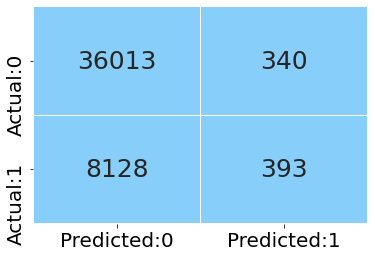

In [107]:
from matplotlib.colors import ListedColormap
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

In [108]:
from sklearn.metrics import classification_report
TN = cm[0,0]

TP = cm[1,1]

FP = cm[0,1]

FN = cm[1,0]
acc_table = classification_report(y_test, y_pred)

print(acc_table)

              precision    recall  f1-score   support

           0       0.82      0.99      0.89     36353
           1       0.54      0.05      0.08      8521

    accuracy                           0.81     44874
   macro avg       0.68      0.52      0.49     44874
weighted avg       0.76      0.81      0.74     44874



In [109]:
#we got accuracy of 81% with logistic regression model .there more observations for low positive rate compared to high 
#positive rate .

In [110]:
from sklearn import metrics

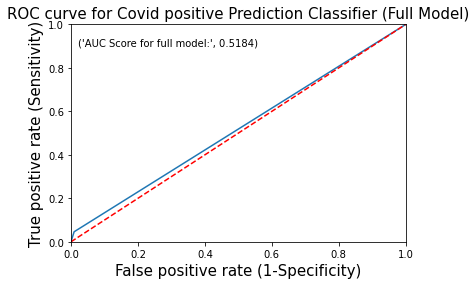

In [111]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

In [112]:
#The roc auc score for logistic regression model is 0.5184 which says there is proper seperability happening in the target classes.

In [113]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
X_train_rfe = X_train.iloc[:,1:]
X_test_rfe = X_test.iloc[:,1:]

logreg = LogisticRegression()

rfe_model = RFE(estimator = logreg, n_features_to_select = 7)

rfe_model = rfe_model.fit(X_train_rfe, y_train)

feat_index = pd.Series(data = rfe_model.ranking_, index = X_train_rfe.columns)

signi_feat_rfe = feat_index[feat_index==1].index

print(signi_feat_rfe)

Index(['total_deaths', 'people_fully_vaccinated', 'continent_Asia',
       'continent_Europe', 'continent_North America', 'continent_Oceania',
       'continent_South America'],
      dtype='object')


In [114]:
logreg_rfe = sm.Logit(y_train, X_train[['total_deaths', 'people_fully_vaccinated', 'continent_Asia',
       'continent_Europe', 'continent_North America', 'continent_Oceania',
       'continent_South America']]).fit()

# print the summary of the model
print(logreg_rfe.summary())

Optimization terminated successfully.
         Current function value: 0.672231
         Iterations 5
                             Logit Regression Results                             
Dep. Variable:     positive_rate_category   No. Observations:               104704
Model:                              Logit   Df Residuals:                   104697
Method:                               MLE   Df Model:                            6
Date:                    Sun, 03 Apr 2022   Pseudo R-squ.:                 -0.3898
Time:                            19:09:31   Log-Likelihood:                -70385.
converged:                           True   LL-Null:                       -50643.
Covariance Type:                nonrobust   LLR p-value:                     1.000
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
total_deaths                0.3470      0.009     

In [115]:
#after performing recursive feature elimination on the model we got significant features from that significant features we
#built our model .

In [116]:
X_test_rfe.head()

,total_deaths,population,people_fully_vaccinated,year,month,continent_Asia,continent_Europe,continent_North America,continent_Oceania,continent_South America
80951,1.773359,2.725493,2.671125,0.846398,0.606664,-0.529511,-0.534837,-0.420814,-0.224778,-0.248067
138883,-0.509195,0.546012,-0.364478,0.846398,-1.191198,-0.529511,-0.534837,-0.420814,-0.224778,-0.248067
28745,1.881563,-0.139550,3.243172,0.846398,0.928773,-0.529511,-0.534837,-0.420814,-0.224778,4.031175
27065,-0.539255,-0.564777,-0.364478,-1.098201,0.928773,-0.529511,-0.534837,-0.420814,-0.224778,-0.248067
125866,-0.511947,0.634165,-0.364478,-1.098201,0.290202,1.888536,-0.534837,-0.420814,-0.224778,-0.248067


In [117]:
y_pred_prob = logreg_rfe.predict(X_test_rfe[['total_deaths', 'people_fully_vaccinated', 'continent_Asia',
       'continent_Europe', 'continent_North America', 'continent_Oceania',
       'continent_South America']])

y_pred_prob.head()
y_pred = [ 0 if x < 0.5 else 1 for x in y_pred_prob]

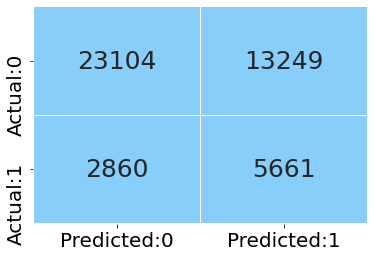

In [118]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

In [119]:
result = classification_report(y_test, y_pred)

# print the result
print(result)

              precision    recall  f1-score   support

           0       0.89      0.64      0.74     36353
           1       0.30      0.66      0.41      8521

    accuracy                           0.64     44874
   macro avg       0.59      0.65      0.58     44874
weighted avg       0.78      0.64      0.68     44874



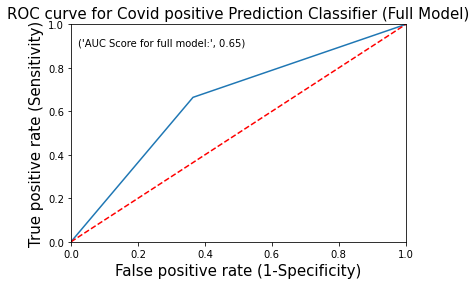

In [120]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

In [121]:
data_vi.dtypes


total_deaths               float64
population                 float64
people_fully_vaccinated    float64
year                       float64
month                      float64
continent_Asia             float64
continent_Europe           float64
continent_North America    float64
continent_Oceania          float64
continent_South America    float64
positive_rate_category       int32
dtype: object

In [122]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
model=DecisionTreeClassifier(random_state=1)
model=model.fit(X_train_rfe,y_train)
y_pred=model.predict(X_test_rfe)
print('ACCURACY SCORE :',accuracy_score(y_test, y_pred))
print(roc_auc_score(y_test,y_pred))

ACCURACY SCORE : 0.9838213664928467
0.9724490857655199


In [123]:
ACCURACY_DECISION_TREE=accuracy_score(y_test, y_pred)
ACCURACY_DECISION_TREE
ROC_score_decision_tree=roc_auc_score(y_test,y_pred)
ROC_score_decision_tree

0.9724490857655199

In [124]:
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
precision_decision_tree=precision_score(y_test, y_pred)
precision_decision_tree
f1_score_decision_tree=f1_score(y_test, y_pred)
f1_score_decision_tree
recall_decision_tree=recall_score(y_test, y_pred)
recall_decision_tree

0.954113366975707

In [125]:
report=classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     36353
           1       0.96      0.95      0.96      8521

    accuracy                           0.98     44874
   macro avg       0.97      0.97      0.97     44874
weighted avg       0.98      0.98      0.98     44874



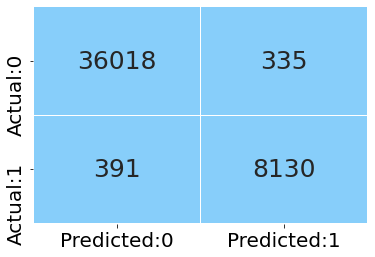

In [126]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

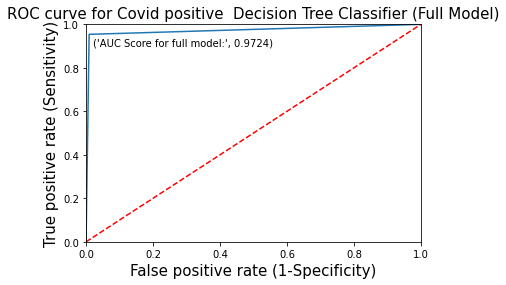

In [127]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive  Decision Tree Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

In [128]:
from sklearn.ensemble import RandomForestClassifier
rf_model=RandomForestClassifier(n_estimators=10,random_state=10)
rf_model=rf_model.fit(X_train_rfe,y_train)
y_pred=rf_model.predict(X_test_rfe)
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     36353
           1       0.97      0.96      0.96      8521

    accuracy                           0.99     44874
   macro avg       0.98      0.97      0.98     44874
weighted avg       0.99      0.99      0.99     44874



In [129]:
precision_RandomForest=precision_score(y_test, y_pred)
precision_RandomForest
f1_score_RandomForest=f1_score(y_test, y_pred)
f1_score_RandomForest
recall_RandomForest=recall_score(y_test, y_pred)
recall_RandomForest

0.955286938152799

In [130]:
ACCURACY_RANDOM_FOREST_TREE=accuracy_score(y_test, y_pred)
ACCURACY_RANDOM_FOREST_TREE
ROC_score_RANDOM_FOREST_TREE=roc_auc_score(y_test,y_pred)
ROC_score_RANDOM_FOREST_TREE

0.9738336046910668

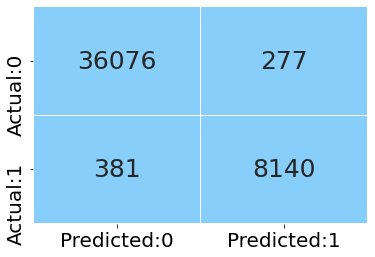

In [131]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

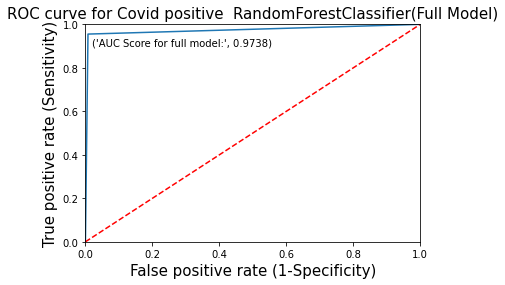

In [132]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive  RandomForestClassifier(Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

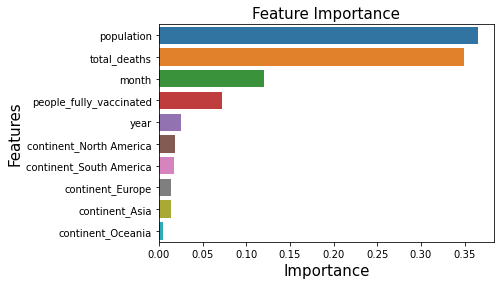

In [133]:
important_features = pd.DataFrame({'Features': X_train_rfe.columns, 
                                   'Importance': rf_model.feature_importances_})

important_features = important_features.sort_values('Importance', ascending = False)

sns.barplot(x = 'Importance', y = 'Features', data = important_features)

plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)

# display the plot
plt.show()

In [134]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score

ada_model = AdaBoostClassifier(n_estimators=40, random_state=10)
ada_model.fit(X_train_rfe, y_train)
y_pred = ada_model.predict(X_test_rfe)

round(accuracy_score(y_test, y_pred),2)

0.83

In [135]:
precision_adaboost=precision_score(y_test, y_pred)
precision_adaboost
f1_score_adaboost=f1_score(y_test, y_pred)
f1_score_adaboost
recall_adaboost=recall_score(y_test, y_pred)
recall_adaboost

0.23940852012674568

In [136]:
report=classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.84      0.97      0.90     36353
           1       0.64      0.24      0.35      8521

    accuracy                           0.83     44874
   macro avg       0.74      0.60      0.62     44874
weighted avg       0.81      0.83      0.80     44874



In [137]:
ACCURACY_ADABOOST=accuracy_score(y_test, y_pred)
ACCURACY_ADABOOST
ROC_score_ADABOOST=roc_auc_score(y_test,y_pred)
ROC_score_ADABOOST

0.6036945772311445

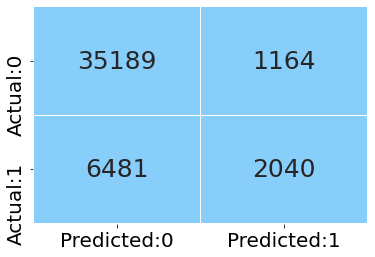

In [138]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

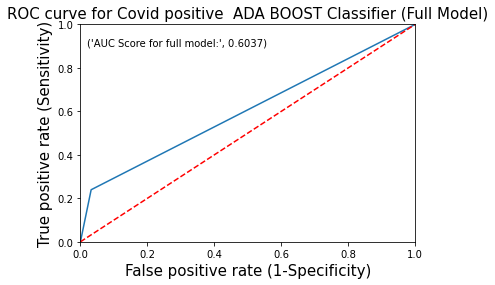

In [139]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive  ADA BOOST Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

In [140]:
from sklearn.ensemble import GradientBoostingClassifier
gboost_model = GradientBoostingClassifier(n_estimators = 100, max_depth = 3, random_state = 10)
gboost_model.fit(X_train_rfe, y_train)
y_pred = gboost_model.predict(X_test_rfe)

round(accuracy_score(y_test, y_pred),2)

0.87

In [141]:
precision_Gradientboost=precision_score(y_test, y_pred)
precision_Gradientboost
f1_score_Gradientboost=f1_score(y_test, y_pred)
f1_score_Gradientboost
recall_Gradientboost=recall_score(y_test, y_pred)
recall_Gradientboost

0.38915620232367093

In [142]:
ACCURACY_GradientBoosting=accuracy_score(y_test, y_pred)
ACCURACY_GradientBoosting
ROC_score_GradientBoosting=roc_auc_score(y_test,y_pred)
ROC_score_GradientBoosting

0.6846889585876325

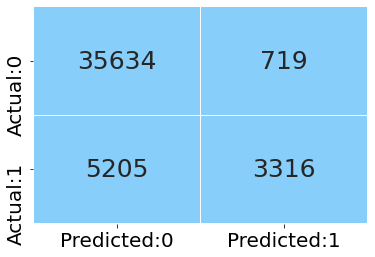

In [143]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

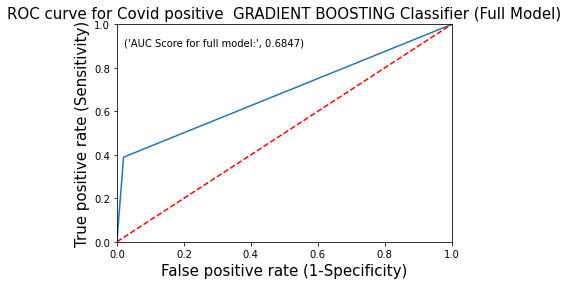

In [144]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive  GRADIENT BOOSTING Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

In [145]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.98      0.92     36353
           1       0.82      0.39      0.53      8521

    accuracy                           0.87     44874
   macro avg       0.85      0.68      0.73     44874
weighted avg       0.86      0.87      0.85     44874



In [146]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
import warnings
warnings.filterwarnings(action='ignore')
xgb_model = XGBClassifier(learning_rate=0.01, gamma =2 )

xgb_model.fit(X_train_rfe, y_train)
y_pred_xg =xgb_model.predict(X_test_rfe)
print('roc_auc_Score:',round(roc_auc_score(y_test, y_pred_xg),2))
print('\n')
print('XG Boost')
print(classification_report(y_test, y_pred_xg))

[19:10:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
roc_auc_Score: 0.63


XG Boost
              precision    recall  f1-score   support

           0       0.85      0.98      0.91     36353
           1       0.81      0.29      0.42      8521

    accuracy                           0.85     44874
   macro avg       0.83      0.63      0.67     44874
weighted avg       0.85      0.85      0.82     44874



In [147]:
precision_Xgboost=precision_score(y_test, y_pred_xg)
precision_Xgboost
f1_score_Xgboost=f1_score(y_test, y_pred_xg)
f1_score_Xgboost
recall_Xgboost=recall_score(y_test, y_pred_xg)
recall_Xgboost

0.2854125102687478

In [148]:
ACCURACY_XgBoosting=accuracy_score(y_test, y_pred_xg)
ACCURACY_XgBoosting
ROC_score_XgBoosting=roc_auc_score(y_test,y_pred_xg)
ROC_score_XgBoosting

0.6346463976260527

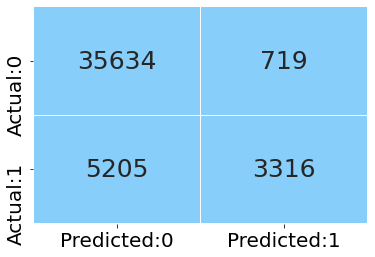

In [149]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

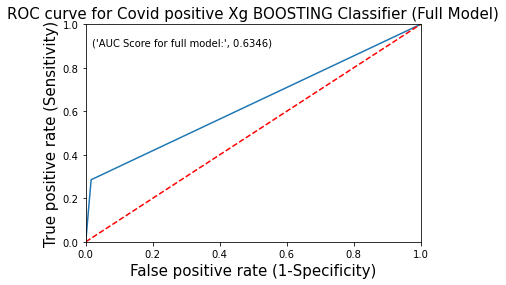

In [150]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_xg)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred_xg),4)))

plt.title('ROC curve for Covid positive Xg BOOSTING Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

In [162]:
from imblearn.over_sampling import SMOTE
sm=SMOTE(sampling_strategy=0.7)
xtrain_sample,y_train_sample=sm.fit_resample(X_train_rfe,y_train)


In [163]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
model=DecisionTreeClassifier(random_state=1)
model=model.fit(xtrain_sample,y_train_sample)
y_pred=model.predict(X_test_rfe)
print('ACCURACY SCORE :',accuracy_score(y_test, y_pred))
print(roc_auc_score(y_test,y_pred))

ACCURACY SCORE : 0.9838213664928467
0.9768516902741993


In [164]:
precision_dt1=precision_score(y_test, y_pred)
precision_dt1
f1_score_dt1=f1_score(y_test, y_pred)
f1_score_dt1
recall_dt1=recall_score(y_test, y_pred)
recall_dt1

0.9656143645112076

In [165]:
ACCURACY_DECISIONTREE=accuracy_score(y_test, y_pred)
ACCURACY_DECISIONTREE
ROC_score_DECISIONTREE=roc_auc_score(y_test,y_pred)
ROC_score_DECISIONTREE

0.9768516902741993

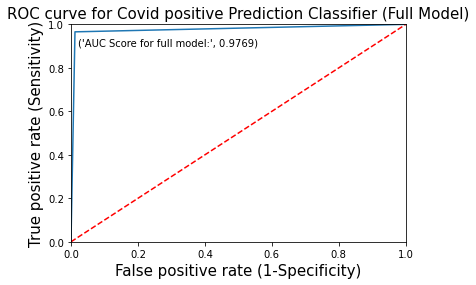

In [166]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

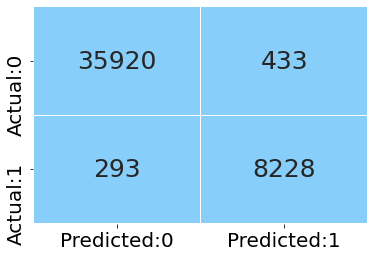

In [167]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

In [168]:
report=classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     36353
           1       0.95      0.97      0.96      8521

    accuracy                           0.98     44874
   macro avg       0.97      0.98      0.97     44874
weighted avg       0.98      0.98      0.98     44874



In [169]:
from sklearn.ensemble import RandomForestClassifier
model=RandomForestClassifier(n_estimators=10,random_state=10)
model=model.fit(xtrain_sample,y_train_sample)
y_pred=model.predict(X_test_rfe)
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     36353
           1       0.96      0.96      0.96      8521

    accuracy                           0.98     44874
   macro avg       0.97      0.98      0.98     44874
weighted avg       0.98      0.98      0.98     44874



In [170]:
precision_RF=precision_score(y_test, y_pred)
precision_RF
f1_score_RF=f1_score(y_test, y_pred)
f1_score_RF
recall_RF=recall_score(y_test, y_pred)
recall_RF

0.9627977936861871

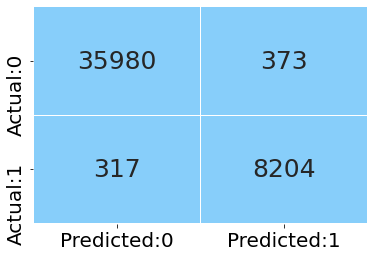

In [171]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

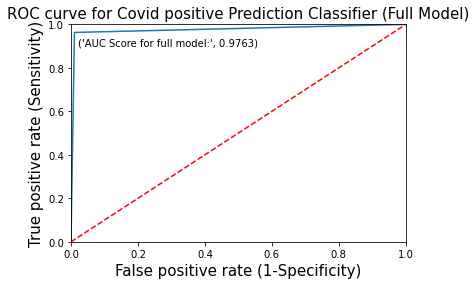

In [172]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

In [173]:
ACCURACY_RANDOMTREE=accuracy_score(y_test, y_pred)
ACCURACY_RANDOMTREE
ROC_score_RANDOMTREE=roc_auc_score(y_test,y_pred)
ROC_score_RANDOMTREE

0.9762686462447936

In [174]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score

ada_model = AdaBoostClassifier(n_estimators=40, random_state=10)
ada_model.fit(xtrain_sample, y_train_sample)
y_pred = ada_model.predict(X_test_rfe)

round(accuracy_score(y_test, y_pred),2)

0.76

In [175]:
precision_adaboost1=precision_score(y_test, y_pred)
precision_adaboost1
f1_score_adaboost1=f1_score(y_test, y_pred)
f1_score_adaboost1
recall_adaboost1=recall_score(y_test, y_pred)
recall_adaboost1

0.7866447600046943

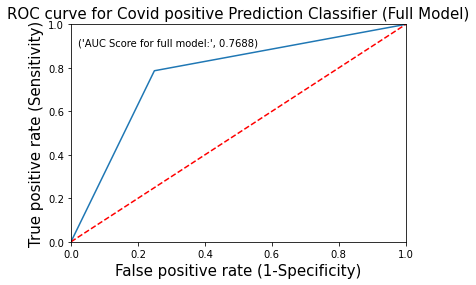

In [176]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

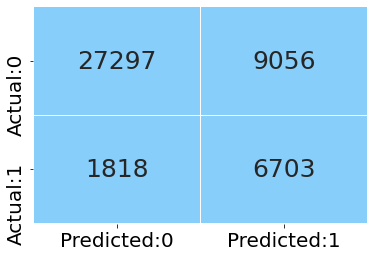

In [177]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

In [178]:
report=classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.94      0.75      0.83     36353
           1       0.43      0.79      0.55      8521

    accuracy                           0.76     44874
   macro avg       0.68      0.77      0.69     44874
weighted avg       0.84      0.76      0.78     44874



In [179]:
ACCURACY_adaboost=accuracy_score(y_test, y_pred)
ACCURACY_adaboost
ROC_score_adaboost=roc_auc_score(y_test,y_pred)
ROC_score_adaboost

0.7687659472457659

In [180]:
from sklearn.ensemble import GradientBoostingClassifier
gboost_model = GradientBoostingClassifier(n_estimators = 100, max_depth = 3, random_state = 10)
gboost_model.fit(xtrain_sample, y_train_sample)
y_pred = gboost_model.predict(X_test_rfe)

round(accuracy_score(y_test, y_pred),2)

0.81

In [181]:
precision_Gradientboost1=precision_score(y_test, y_pred)
precision_Gradientboost1
f1_score_Gradientboost1=f1_score(y_test, y_pred)
f1_score_Gradientboost1
recall_Gradientboost1=recall_score(y_test, y_pred)
recall_Gradientboost1

0.7936861870672456

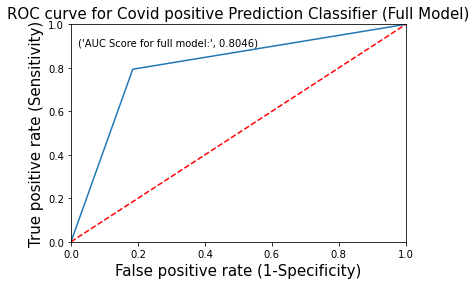

In [182]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

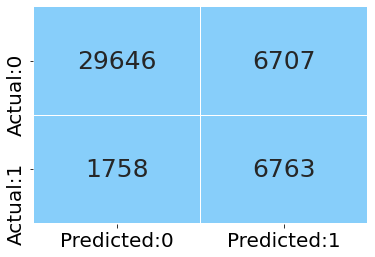

In [183]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

In [184]:
report=classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.94      0.82      0.88     36353
           1       0.50      0.79      0.62      8521

    accuracy                           0.81     44874
   macro avg       0.72      0.80      0.75     44874
weighted avg       0.86      0.81      0.83     44874



In [185]:
ACCURACY_gradientboost=accuracy_score(y_test, y_pred)
ACCURACY_gradientboost
ROC_score_gradientboost=roc_auc_score(y_test,y_pred)
ROC_score_gradientboost

0.8045948609255851

In [186]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
import warnings
warnings.filterwarnings(action='ignore')
xgb_model = XGBClassifier(learning_rate=0.01, gamma =2 )

xgb_model.fit(xtrain_sample, y_train_sample)
y_pred_xg =xgb_model.predict(X_test_rfe)
print('roc_auc_Score:',round(roc_auc_score(y_test, y_pred_xg),2))
print('\n')
print('XG Boost')
print(classification_report(y_test, y_pred_xg))

[19:13:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
roc_auc_Score: 0.79


XG Boost
              precision    recall  f1-score   support

           0       0.94      0.80      0.86     36353
           1       0.47      0.78      0.59      8521

    accuracy                           0.79     44874
   macro avg       0.71      0.79      0.72     44874
weighted avg       0.85      0.79      0.81     44874



In [187]:
precision_Xgboost1=precision_score(y_test, y_pred_xg)
precision_Gradientboost
f1_score_Xgboost1=f1_score(y_test, y_pred_xg)
f1_score_Xgboost1
recall_Xgboost1=recall_score(y_test, y_pred_xg)
recall_Xgboost1

0.7785471188827603

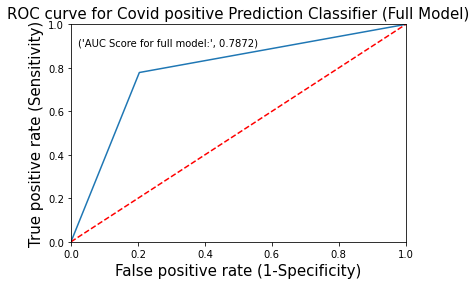

In [188]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_xg)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred_xg),4)))

plt.title('ROC curve for Covid positive Prediction Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

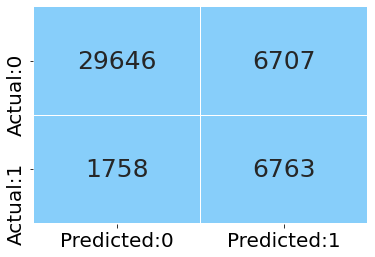

In [189]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

In [190]:
ACCURACY_Xgboost1=accuracy_score(y_test, y_pred_xg)
ACCURACY_Xgboost1
ROC_score_Xgboost1=roc_auc_score(y_test,y_pred_xg)
ROC_score_Xgboost1

0.7871912003513463

In [191]:
from imblearn.over_sampling import SMOTE
sm=SMOTE(sampling_strategy=0.6)
xtrain_sample1,y_train_sample1=sm.fit_resample(X_train_rfe,y_train)

In [192]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score

ada_model = AdaBoostClassifier(n_estimators=40, random_state=10)
ada_model.fit(xtrain_sample1, y_train_sample1)
y_pred = ada_model.predict(X_test_rfe)

round(accuracy_score(y_test, y_pred),2)

0.8

In [193]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score

ada_model = AdaBoostClassifier(n_estimators=40, random_state=10)
ada_model.fit(xtrain_sample1, y_train_sample1)
y_pred = ada_model.predict(X_test_rfe)

round(accuracy_score(y_test, y_pred),2)

0.8

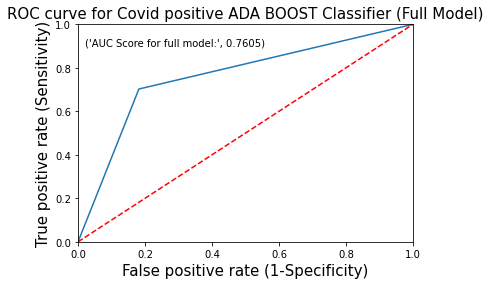

In [194]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive ADA BOOST Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

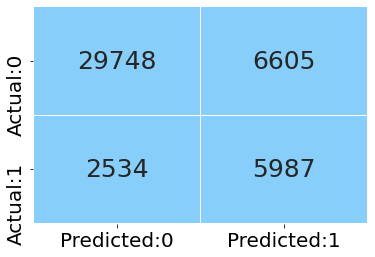

In [195]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

In [196]:
precision_adaboost2=precision_score(y_test, y_pred)
precision_adaboost2
f1_score_adaboost2=f1_score(y_test, y_pred)
f1_score_adaboost2
recall_adaboost2=recall_score(y_test, y_pred)
recall_adaboost2

0.702617063724915

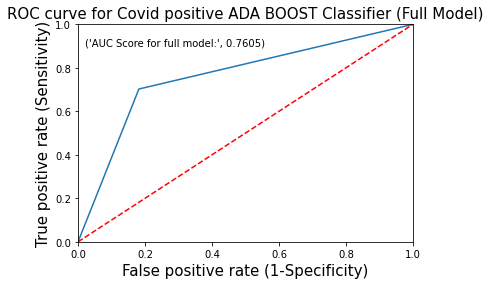

In [197]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive ADA BOOST Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

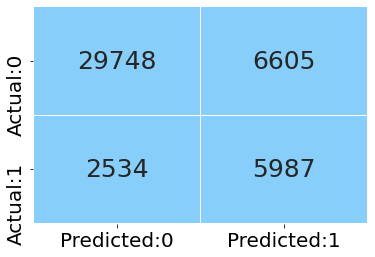

In [198]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

In [199]:
ACCURACY_adaboost2=accuracy_score(y_test, y_pred)
ACCURACY_adaboost2
ROC_score_adaboost2=roc_auc_score(y_test,y_pred)
ROC_score_adaboost2

0.7604632096056974

In [200]:
from sklearn.ensemble import GradientBoostingClassifier
gboost_model = GradientBoostingClassifier(n_estimators = 100, max_depth = 3, random_state = 10)
gboost_model.fit(xtrain_sample1, y_train_sample1)
y_pred = gboost_model.predict(X_test_rfe)

round(accuracy_score(y_test, y_pred),2)

0.83

In [201]:
precision_Gradientboost2=precision_score(y_test, y_pred)
precision_Gradientboost
f1_score_Gradientboost2=f1_score(y_test, y_pred)
f1_score_Gradientboost2
recall_Gradientboost2=recall_score(y_test, y_pred)
recall_Gradientboost2

0.751672338927356

In [202]:
ACCURACY_gradientboost2=accuracy_score(y_test, y_pred)
ACCURACY_gradientboost2
ROC_score_gradientboost2=roc_auc_score(y_test,y_pred)
ROC_score_gradientboost2

0.7986623461203501

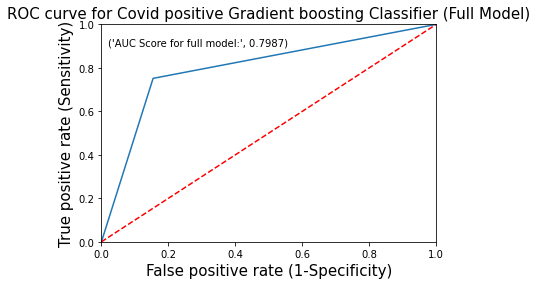

In [203]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred),4)))

plt.title('ROC curve for Covid positive Gradient boosting Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

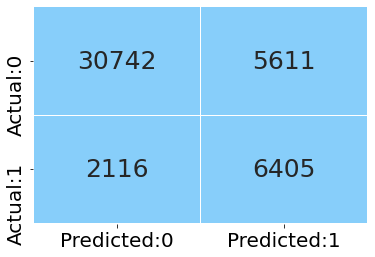

In [204]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

In [205]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
import warnings
warnings.filterwarnings(action='ignore')
xgb_model = XGBClassifier(learning_rate=0.01, gamma =2 )

xgb_model.fit(xtrain_sample1, y_train_sample1)
y_pred_xg =xgb_model.predict(X_test_rfe)
print('roc_auc_Score:',round(roc_auc_score(y_test, y_pred_xg),2))
print('\n')
print('XG Boost')
print(classification_report(y_test, y_pred_xg))

[19:15:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
roc_auc_Score: 0.78


XG Boost
              precision    recall  f1-score   support

           0       0.93      0.81      0.86     36353
           1       0.48      0.74      0.58      8521

    accuracy                           0.80     44874
   macro avg       0.70      0.78      0.72     44874
weighted avg       0.84      0.80      0.81     44874



In [206]:
ACCURACY_Xgboost2=accuracy_score(y_test, y_pred_xg)
ACCURACY_Xgboost2
ROC_score_Xgboost2=roc_auc_score(y_test,y_pred_xg)
ROC_score_Xgboost2

0.7760272030137997

In [207]:
precision_Xgboost2=precision_score(y_test, y_pred_xg)
precision_Xgboost2
f1_score_Xgboost2=f1_score(y_test, y_pred_xg)
f1_score_Xgboost2
recall_Xgboost2=recall_score(y_test, y_pred_xg)
recall_Xgboost2

0.7447482689825138

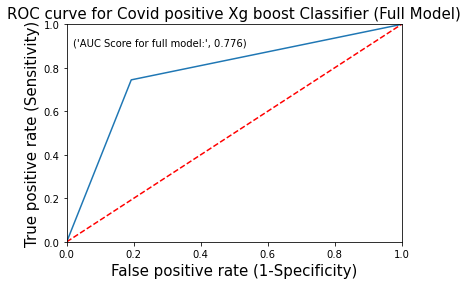

In [208]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_xg)
plt.plot(fpr, tpr)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])


plt.plot([0, 1], [0, 1],'r--')

plt.text(x = 0.02, y = 0.9, s = ('AUC Score for full model:',round(metrics.roc_auc_score(y_test, y_pred_xg),4)))

plt.title('ROC curve for Covid positive Xg boost Classifier (Full Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

plt.show()

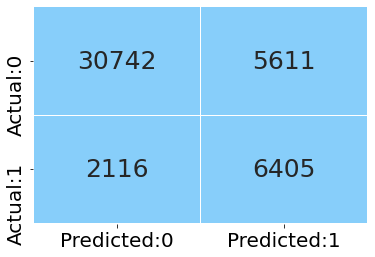

In [209]:
cm = confusion_matrix(y_test, y_pred)

conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])


sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

plt.xticks(fontsize = 20)

plt.yticks(fontsize = 20)

plt.show()

In [210]:
D1=pd.DataFrame(data=[[ACCURACY_DECISION_TREE,ACCURACY_DECISIONTREE,ACCURACY_RANDOM_FOREST_TREE,ACCURACY_RANDOMTREE,ACCURACY_ADABOOST,ACCURACY_adaboost,ACCURACY_adaboost2,ACCURACY_GradientBoosting,ACCURACY_gradientboost,ACCURACY_gradientboost2,ACCURACY_XgBoosting,ACCURACY_Xgboost1,ACCURACY_Xgboost2]],
        columns=[['ACCURACY(DT)','ACCURACY(DT USING SMOTE WITH SS=0.7)','ACCURACY(Random forest)','ACCURACY(RF USING SMOTE WITH SS=0.7)','ACCURACY(adaboost)','ACCURACY(adaboost USING SMOTE WITH SS=0.7)','ACCURACY(adaboost USING SMOTE WITH SS=0.6)','ACCURACY(Gradientboost)','ACCURACY(gradientboost USING SMOTE WITH SS=0.7)',
                  'ACCURACY(gradientboost USING SMOTE WITH SS=0.6)','ACCURACY(Xgboost)','ACCURACY(Xg USING SMOTE WITH SS=0.7)','ACCURACY(Xg USING SMOTE WITH SS=0.6)']],index=['ACCURACY'])


In [211]:
D2=pd.DataFrame(data=[[ROC_score_decision_tree,ROC_score_DECISIONTREE,ROC_score_RANDOM_FOREST_TREE,ROC_score_RANDOMTREE,ROC_score_ADABOOST,ROC_score_adaboost,ROC_score_adaboost2,ROC_score_GradientBoosting,ROC_score_gradientboost,ROC_score_gradientboost2,ROC_score_XgBoosting,ROC_score_Xgboost1,ROC_score_Xgboost2]],
        columns=[['ROC_score(DT)','ROC_score(DT USING SMOTE WITH SS=0.7)','ROC_score(Random forest)','ROC_score(RF USING SMOTE WITH SS=0.7)','ROC_score(adaboost)','ROC_score(adaboost USING SMOTE WITH SS=0.7)','ROC_score(adaboost USING SMOTE WITH SS=0.6)','ROC_score(Gradientboost)','ROC_score(gradientboost USING SMOTE WITH SS=0.7)',
                  'ROC_score(gradientboost USING SMOTE WITH SS=0.6)','ROC_score(Xgboost)','ROC_score(Xg USING SMOTE WITH SS=0.7)','ROC_score(Xg USING SMOTE WITH SS=0.6)']],index=['ROC_score'])


In [212]:
D2=D2.T
D2

,ROC_score
ROC_score(DT),0.972449
ROC_score(DT USING SMOTE WITH SS=0.7),0.976852
ROC_score(Random forest),0.973834
ROC_score(RF USING SMOTE WITH SS=0.7),0.976269
ROC_score(adaboost),0.603695
ROC_score(adaboost USING SMOTE WITH SS=0.7),0.768766
ROC_score(adaboost USING SMOTE WITH SS=0.6),0.760463
ROC_score(Gradientboost),0.684689
ROC_score(gradientboost USING SMOTE WITH SS=0.7),0.804595
ROC_score(gradientboost USING SMOTE WITH SS=0.6),0.798662


In [220]:
D1=D1.T
D1

,ACCURACY
ACCURACY(DT),0.983821
ACCURACY(DT USING SMOTE WITH SS=0.7),0.983821
ACCURACY(Random forest),0.985337
ACCURACY(RF USING SMOTE WITH SS=0.7),0.984624
ACCURACY(adaboost),0.829634
ACCURACY(adaboost USING SMOTE WITH SS=0.7),0.757677
ACCURACY(adaboost USING SMOTE WITH SS=0.6),0.796341
ACCURACY(Gradientboost),0.867986
ACCURACY(gradientboost USING SMOTE WITH SS=0.7),0.811361
ACCURACY(gradientboost USING SMOTE WITH SS=0.6),0.827807


In [214]:
D3=pd.DataFrame(data=[[precision_decision_tree,precision_dt1,precision_RandomForest,precision_RF,precision_adaboost,precision_adaboost1,precision_adaboost2,precision_Gradientboost,precision_Gradientboost1,precision_Gradientboost2,precision_Xgboost,precision_Xgboost1,precision_Xgboost2]],
        columns=[['precision(DT)','precision(DT USING SMOTE WITH SS=0.7)','precision(Random forest)','precision(RF USING SMOTE WITH SS=0.7)','precision(adaboost)','precision(adaboost USING SMOTE WITH SS=0.7)','precision(adaboost USING SMOTE WITH SS=0.6)','precision(Gradientboost)','precision(gradientboost USING SMOTE WITH SS=0.7)',
                  'precision(gradientboost USING SMOTE WITH SS=0.6)','precision(Xgboost)','precision(Xg USING SMOTE WITH SS=0.7)','precision(Xg USING SMOTE WITH SS=0.6)']],index=['Precision'])
D3=D3.T
D3

,Precision
precision(DT),0.960425
precision(DT USING SMOTE WITH SS=0.7),0.950006
precision(Random forest),0.967090
precision(RF USING SMOTE WITH SS=0.7),0.956512
precision(adaboost),0.636704
precision(adaboost USING SMOTE WITH SS=0.7),0.425344
precision(adaboost USING SMOTE WITH SS=0.6),0.475461
precision(Gradientboost),0.821809
precision(gradientboost USING SMOTE WITH SS=0.7),0.502079
precision(gradientboost USING SMOTE WITH SS=0.6),0.533039


In [215]:
D4=pd.DataFrame(data=[[f1_score_decision_tree,f1_score_dt1,f1_score_RandomForest,f1_score_RF,f1_score_adaboost,f1_score_adaboost1,f1_score_adaboost2,f1_score_Gradientboost,f1_score_Gradientboost1,f1_score_Gradientboost2,f1_score_Xgboost,f1_score_Xgboost1,f1_score_Xgboost2]],
        columns=[['f1_score(DT)','f1_score(DT USING SMOTE WITH SS=0.7)','f1_score(Random forest)','f1_score(RF USING SMOTE WITH SS=0.7)','f1_score(adaboost)','f1_score(adaboost USING SMOTE WITH SS=0.7)','f1_score(adaboost USING SMOTE WITH SS=0.6)','f1_score(Gradientboost)','f1_score(gradientboost USING SMOTE WITH SS=0.7)',
                  'f1_score(gradientboost USING SMOTE WITH SS=0.6)','f1_score(Xgboost)','f1_score(Xg USING SMOTE WITH SS=0.7)','f1_score(Xg USING SMOTE WITH SS=0.6)']],index=['f1_score'])
D4=D4.T
D4

,f1_score
f1_score(DT),0.957259
f1_score(DT USING SMOTE WITH SS=0.7),0.957746
f1_score(Random forest),0.961152
f1_score(RF USING SMOTE WITH SS=0.7),0.959644
f1_score(adaboost),0.347974
f1_score(adaboost USING SMOTE WITH SS=0.7),0.552142
f1_score(adaboost USING SMOTE WITH SS=0.6),0.567139
f1_score(Gradientboost),0.528194
f1_score(gradientboost USING SMOTE WITH SS=0.7),0.615070
f1_score(gradientboost USING SMOTE WITH SS=0.6),0.623752


In [216]:
D5=pd.DataFrame(data=[[recall_decision_tree,recall_dt1,recall_RandomForest,recall_RF,recall_adaboost,recall_adaboost1,recall_adaboost2,recall_Gradientboost,recall_Gradientboost1,recall_Gradientboost2,recall_Xgboost,recall_Xgboost1,recall_Xgboost2]],
        columns=[['recall(DT)','recall(DT USING SMOTE WITH SS=0.7)','recall(Random forest)','recall(RF USING SMOTE WITH SS=0.7)','recall(adaboost)','recall(adaboost USING SMOTE WITH SS=0.7)','recall(adaboost USING SMOTE WITH SS=0.6)','recall(Gradientboost)','recall(gradientboost USING SMOTE WITH SS=0.7)',
                  'recall(gradientboost USING SMOTE WITH SS=0.6)','recall(Xgboost)','recall(Xg USING SMOTE WITH SS=0.7)','recall(Xg USING SMOTE WITH SS=0.6)']],index=['recall'])
D5=D5.T
D5

,recall
recall(DT),0.954113
recall(DT USING SMOTE WITH SS=0.7),0.965614
recall(Random forest),0.955287
recall(RF USING SMOTE WITH SS=0.7),0.962798
recall(adaboost),0.239409
recall(adaboost USING SMOTE WITH SS=0.7),0.786645
recall(adaboost USING SMOTE WITH SS=0.6),0.702617
recall(Gradientboost),0.389156
recall(gradientboost USING SMOTE WITH SS=0.7),0.793686
recall(gradientboost USING SMOTE WITH SS=0.6),0.751672


In [234]:

D5

,recall
recall(DT),0.954113
recall(DT USING SMOTE WITH SS=0.7),0.965614
recall(Random forest),0.955287
recall(RF USING SMOTE WITH SS=0.7),0.962798
recall(adaboost),0.239409
recall(adaboost USING SMOTE WITH SS=0.7),0.786645
recall(adaboost USING SMOTE WITH SS=0.6),0.702617
recall(Gradientboost),0.389156
recall(gradientboost USING SMOTE WITH SS=0.7),0.793686
recall(gradientboost USING SMOTE WITH SS=0.6),0.751672


In [239]:
df_algo_values = pd.DataFrame({'Alogorithms':['Decision Tree(DT)','DT USING SMOTE WITH SS=0.7','Random forest',
                                             'RF USING SMOTE WITH SS=0.7','Adaboost','Adaboost USING SMOTE WITH SS=0.7',
                                             'adaboost USING SMOTE WITH SS=0.6','Gradientboost','Gradientboost USING SMOTE WITH SS=0.7',
                                             'gradientboost USING SMOTE WITH SS=0.6','Xgboost','Xg USING SMOTE WITH SS=0.7',
                                             'Xg USING SMOTE WITH SS=0.6'],
                              'ACCURACY':[0.983821,0.983821,0.985337,0.984624,0.829634,0.757677,0.796341,0.867986,0.811361,0.827807,0.851250,0.792552,0.795427],
                              'ROC SCORE':[0.972449,0.976852,0.973834,0.976269,0.603695,0.768766,0.760463,0.684689,0.804595,0.798662,0.634646,0.787191,0.776027],
                              'PRECISION':[0.960425,0.950006,0.967090,0.956512,0.636704,0.425344,0.475461,0.821809,0.502079,0.533039,0.805832,0.471969,0.475320],
                              'F1 SCORE': [0.957259,0.957746,0.961152,0.959644,0.347974,0.552142,0.567139,0.528194,0.615070,0.623752,0.421527,0.587678,0.580285],
                              'RECALL' : [0.954113,0.965614,0.955287,0.962798,0.239409,0.786645,0.702617,0.389156,0.793686,0.751672,0.285413,0.778547,0.744748]})

In [240]:
df_algo_values

,Alogorithms,ACCURACY,ROC SCORE,PRECISION,F1 SCORE,RECALL
0,Decision Tree(DT),0.983821,0.972449,0.960425,0.957259,0.954113
1,DT USING SMOTE WITH SS=0.7,0.983821,0.976852,0.950006,0.957746,0.965614
2,Random forest,0.985337,0.973834,0.967090,0.961152,0.955287
3,RF USING SMOTE WITH SS=0.7,0.984624,0.976269,0.956512,0.959644,0.962798
4,Adaboost,0.829634,0.603695,0.636704,0.347974,0.239409
5,Adaboost USING SMOTE WITH SS=0.7,0.757677,0.768766,0.425344,0.552142,0.786645
6,adaboost USING SMOTE WITH SS=0.6,0.796341,0.760463,0.475461,0.567139,0.702617
7,Gradientboost,0.867986,0.684689,0.821809,0.528194,0.389156
8,Gradientboost USING SMOTE WITH SS=0.7,0.811361,0.804595,0.502079,0.615070,0.793686
9,gradientboost USING SMOTE WITH SS=0.6,0.827807,0.798662,0.533039,0.623752,0.751672


In [241]:
df_algo_values.set_index('Alogorithms')

,ACCURACY,ROC SCORE,PRECISION,F1 SCORE,RECALL
Alogorithms,,,,,
Decision Tree(DT),0.983821,0.972449,0.960425,0.957259,0.954113
DT USING SMOTE WITH SS=0.7,0.983821,0.976852,0.950006,0.957746,0.965614
Random forest,0.985337,0.973834,0.967090,0.961152,0.955287
RF USING SMOTE WITH SS=0.7,0.984624,0.976269,0.956512,0.959644,0.962798
Adaboost,0.829634,0.603695,0.636704,0.347974,0.239409
Adaboost USING SMOTE WITH SS=0.7,0.757677,0.768766,0.425344,0.552142,0.786645
adaboost USING SMOTE WITH SS=0.6,0.796341,0.760463,0.475461,0.567139,0.702617
Gradientboost,0.867986,0.684689,0.821809,0.528194,0.389156
Gradientboost USING SMOTE WITH SS=0.7,0.811361,0.804595,0.502079,0.615070,0.793686


Inference:
 -	For Decision Tree the Accuracy is 0.98, ROC-Score is 0.97, Precision is 0.960, F1-Score is 0.95, and Recall value is 0.95.
 -	For Random Forest the Accuracy is 0.98, ROC-Score is 0.97, Precision is 0.967, F1-Score is 0.96, and Recall value is 0.95.
 -	For Adaboost the Accuracy is 0.82, ROC-Score is 0.60, Precision is 0.63, F1-Score is 0.34, and Recall value is 0.23.
 -	For Gradient boost the Accuracy is 0.86, ROC-Score is 0.64, Precision is 0.82, F1-Score is 0.52, and Recall value is 0.38.
 -	For XgBoost the Accuracy is 0.85, ROC-Score is 0.63, Precision is 0.85, F1-Score is 0.42, and Recall value is 0.28.`
